# SPEECH EMOTION RECOGNITION

__NAME__          :  CHEAH WENG HOE <br>
__TP NUMBER__     :  TP055533 <br>
__INTAKE CODE__   :  APDMF2402DSBA(DE) <br>
***
__DATE CREATED__  :  8/7/2024 <br>
__DATE MODIFIED__ :  8/7/2024 <br>
***

# 1.0: PROJECT SETUP

## 1.1 Python Version

In [1]:
# Checking Python Version
# Should be 3.10 to use tensorflow 2.10 for GPU
from platform import python_version

print(python_version())

3.10.15


## 1.2 Installing Dependencies

In [ ]:
# Upgrade packages
!pip install -U setuptools

In [ ]:
# Installing All Required Libraries
!pip install numpy==1.26.4 pandas matplotlib seaborn librosa --user

In [ ]:
# Installing Tensorflow
!pip install tensorflow==2.10.0 tensorflow-gpu==2.10.0 

In [ ]:
!pip install transformers

In [25]:
# View All Downloaded Libraries
!pip list

Package                      Version
---------------------------- ------------
absl-py                      2.1.0
albucore                     0.0.23
albumentations               2.0.2
annotated-types              0.7.0
anyascii                     0.3.2
asttokens                    2.4.1
astunparse                   1.6.3
audioread                    3.0.1
cachetools                   5.5.0
certifi                      2024.8.30
cffi                         1.17.1
charset-normalizer           3.4.0
click                        8.1.7
colorama                     0.4.6
comm                         0.2.2
contourpy                    1.3.0
contractions                 0.1.73
cycler                       0.12.1
debugpy                      1.8.7
decorator                    5.1.1
exceptiongroup               1.2.2
executing                    2.1.0
filelock                     3.16.1
flatbuffers                  24.3.25
fonttools                    4.54.1
fsspec                       2024.


[notice] A new release of pip is available: 23.0.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip


## 1.3 Importing Dependencies

In [1]:
# Importing Libraries
# System
import os
import sys
import gc
import datetime

# Data Analysis
import numpy as np
import pandas as pd
from collections import Counter

# Data Visualisation
import seaborn as sns
import matplotlib.pyplot as plt

# Audio Processing
import librosa
import librosa.display
from IPython.display import Audio
from imblearn.over_sampling import SMOTE

# MISC
import timeit
import pickle
import joblib
from joblib import Parallel, delayed

# Scikit-Learn
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight

# TENSORFLOW
# https://stackoverflow.com/questions/41415629/importerror-no-module-named-tensorflow-python
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import load_model

# KERAS
from keras.optimizers import adam_v2

# Hyperparameter Tuning
import keras_tuner as kt

# Ignore warning 
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category = DeprecationWarning)

## 1.4 Setting Up GPU

In [2]:
# Avoid OOM errors by setting GPU Memory Consumption Growth
gpus = tf.config.experimental.list_physical_devices('GPU')

for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
# Check GPU available
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

## 1.5 Directories

In [4]:
# Models
model_names = [
    "CNN",
    "Bi-LSTM",
    "Bi-GRU",
    "CNN-Bi-LSTM",
    "Transformer"
]

# Create the project directory
project_dir = "models"
tuner_dir = "keras_tuner"

os.makedirs(project_dir, exist_ok = True)
os.makedirs(tuner_dir, exist_ok = True)

# Create a subdirectory for each model
for each_model in model_names:
    model_dir = os.path.join(project_dir, each_model)
    os.makedirs(model_dir, exist_ok = True)
    # Sub-directories
    os.makedirs(os.path.join(model_dir, 'checkpoints'), exist_ok = True)
    os.makedirs(os.path.join(model_dir, 'logs'), exist_ok = True)
    os.makedirs(os.path.join(model_dir, 'saved_models'), exist_ok = True)

# Validate project directory
if os.path.exists(project_dir) and os.path.isdir(project_dir):
    print(f"{project_dir} exists and is a directory.")
    for each_model in model_names:
        model_dir = os.path.join(project_dir, each_model)
        if os.path.exists(model_dir) and os.path.isdir(model_dir):
            print(f"  - {model_dir} exists.")
        else:
            print(f"  - ERROR: {model_dir} does not exist.")
else:
    print(f"ERROR: {project_dir} does not exist or is not a directory.")

# Validate tuner directory
if os.path.exists(tuner_dir) and os.path.isdir(tuner_dir):
    print(f"{tuner_dir} exists and is a directory.")
else:
    print(f"ERROR: {tuner_dir} does not exist or is not a directory.")

models exists and is a directory.
  - models\CNN exists.
  - models\Bi-LSTM exists.
  - models\Bi-GRU exists.
  - models\CNN-Bi-LSTM exists.
  - models\Transformer exists.
keras_tuner exists and is a directory.


# 2.0 DATA PREPARATION

## 2.1 Loading Datasets

In [5]:
# Data Directory Path
data_dir = "../dataset/Speech"

In [12]:
# Paths to the Dataset
# RAVDESS
Ravdess = os.path.join(data_dir, "RAVDESS/ALL/")
# CREMA
Crema = os.path.join(data_dir, "CREMA-D/")
# TESS
Tess = os.path.join(data_dir, "TESS/TESS_ALL/")
# SAVEE
Savee = os.path.join(data_dir, "SAVEE/ALL/")

### 2.1.1 RADVESS

In [13]:
# RAVDESS File Path
ravdess_dir_list = os.listdir(Ravdess)

# Initialising List to store emotion and paths
file_path = []
gender_list = []
emotion_list = []

# Changing integers to actual emotions.
emotion_dic = {
    '01' : 'neutral',
    '02' : 'neutral',
    '03' : 'happy',
    '04' : 'sad',
    '05' : 'angry',
    '06' : 'fear',
    '07' : 'disgust',
    '08' : 'surprise'
}

for dir in ravdess_dir_list:
    # as their are 20 different actors in our previous directory we need to extract files for each actor.
    actor = os.listdir(os.path.join(Ravdess, dir))
    
    for file in actor:
        part = file.split('.')[0]
        key = part.split('-')[2]

        if key in emotion_dic:
            gender_code = int(part.split('-')[6])
            # File Path
            file_path.append(f"{Ravdess}{dir}/{file}")
            # Gender
            gender_list.append('female' if gender_code & 1 == 0 else 'male')
            # Emotion
            emotion_list.append(emotion_dic[key])
        
# dataframe for emotion of files
ravdess_df = pd.concat([
    pd.DataFrame(file_path, columns = ['path']),
    pd.DataFrame(gender_list, columns = ['gender']),
    pd.DataFrame(emotion_list, columns = ['emotion'])
], axis = 1)

# View the first 5 columns
ravdess_df.head()

,path,gender,emotion
0,../dataset/Speech\RAVDESS/ALL/Actor_01/03-01-0...,male,neutral
1,../dataset/Speech\RAVDESS/ALL/Actor_01/03-01-0...,male,neutral
2,../dataset/Speech\RAVDESS/ALL/Actor_01/03-01-0...,male,neutral
3,../dataset/Speech\RAVDESS/ALL/Actor_01/03-01-0...,male,neutral
4,../dataset/Speech\RAVDESS/ALL/Actor_01/03-01-0...,male,neutral


In [14]:
# Check Distribution
print(ravdess_df.emotion.value_counts())

emotion
neutral     288
happy       192
sad         192
angry       192
fear        192
disgust     192
surprise    192
Name: count, dtype: int64


### 2.1.2 CREMA-D

In [15]:
# CREMA-D File Path
crema_dir_list = os.listdir(Crema)

# Initialising List to store emotion and paths
file_path = []
gender_list = []
emotion_list = []

# Defining Emotion Dictionary
emotion_dic = {
    'HAP' : 'happy',
    'NEU' : 'neutral',
    'SAD' : 'sad',
    'ANG' : 'angry',
    'FEA' : 'fear',
    'DIS' : 'disgust',
}

# Female Actor
female_id_list = [
    '1002', '1003', '1004', '1006', '1007', '1008', '1009', '1010', '1012', '1013', '1018', 
    '1020', '1021', '1024', '1025', '1028', '1029', '1030', '1037', '1043', '1046', '1047', 
    '1049', '1052', '1053', '1054', '1055', '1056', '1058', '1060', '1061', '1063', '1072', 
    '1073', '1074', '1075', '1076', '1078', '1079', '1082', '1084', '1089', '1091',
]

for audio_file in crema_dir_list:
    part = audio_file.split('_') # Split file name into parts
    key = part[2] # Emotion key
    actor_id = part[0]  # Actor ID
    
    if key in emotion_dic:
        # File Path
        file_path.append(os.path.join(Crema, audio_file))
        # Gender
        gender_list.append('female' if part[0] in female_id_list else 'male')
        # Emotion
        emotion_list.append(emotion_dic[key])

# dataframe for emotion of files
crema_df = pd.concat([
    pd.DataFrame(file_path, columns = ['path']),
    pd.DataFrame(gender_list, columns = ['gender']),
    pd.DataFrame(emotion_list, columns = ['emotion'])
], axis = 1)

# View the first 5 columns
crema_df.head()

,path,gender,emotion
0,../dataset/Speech\CREMA-D/1001_DFA_ANG_XX.wav,male,angry
1,../dataset/Speech\CREMA-D/1001_DFA_DIS_XX.wav,male,disgust
2,../dataset/Speech\CREMA-D/1001_DFA_FEA_XX.wav,male,fear
3,../dataset/Speech\CREMA-D/1001_DFA_HAP_XX.wav,male,happy
4,../dataset/Speech\CREMA-D/1001_DFA_NEU_XX.wav,male,neutral


In [16]:
# Check Distribution
print(crema_df.emotion.value_counts())

emotion
angry      1271
disgust    1271
fear       1271
happy      1271
sad        1271
neutral    1087
Name: count, dtype: int64


### 2.1.3 TESS

In [17]:
# TESS File Path
tess_dir_list = os.listdir(Tess)

# Initialising List to store emotion and paths
file_path = []
gender_list = []
emotion_list = []

# Defining Emotion Dictionary
emotion_dic = {
    'OAF_angry': 'angry',
    'YAF_angry': 'angry',
    'OAF_disgust': 'disgust',
    'YAF_disgust': 'disgust',
    'OAF_Fear': 'fear',
    'YAF_fear': 'fear',
    'OAF_happy': 'happy',
    'YAF_happy': 'happy',
    'OAF_neutral': 'neutral',
    'YAF_neutral': 'neutral',
    'OAF_Pleasant_surprise': 'surprise',
    'YAF_pleasant_surprised': 'surprise',
    'OAF_Sad': 'sad',
    'YAF_sad': 'sad',
}

# Iterating through each directory
for directory in tess_dir_list:
    audio_files = os.listdir(f"{Tess}{directory}")
    for audio_file in audio_files:
        # Append file path
        file_path.append(f"{Tess}{directory}/{audio_file}")
        # Append gender
        gender_list.append('female')  # TESS dataset only has female speakers
        # Append emotion
        emotion_list.append(emotion_dic.get(directory, 'Unknown'))
        
# Create Data Frame
tess_df = pd.concat([
    pd.DataFrame(file_path, columns = ['path']),
    pd.DataFrame(gender_list, columns = ['gender']),
    pd.DataFrame(emotion_list, columns = ['emotion'])
], axis = 1)

# View the first 5 columns
tess_df.head()

,path,gender,emotion
0,../dataset/Speech\TESS/TESS_ALL/OAF_angry/OAF_...,female,angry
1,../dataset/Speech\TESS/TESS_ALL/OAF_angry/OAF_...,female,angry
2,../dataset/Speech\TESS/TESS_ALL/OAF_angry/OAF_...,female,angry
3,../dataset/Speech\TESS/TESS_ALL/OAF_angry/OAF_...,female,angry
4,../dataset/Speech\TESS/TESS_ALL/OAF_angry/OAF_...,female,angry


In [18]:
# Check Distribution
print(tess_df.emotion.value_counts())

emotion
angry       400
disgust     400
fear        400
happy       400
neutral     400
surprise    400
sad         400
Name: count, dtype: int64


### 2.1.4 SAVEE

In [19]:
# SAVEE File Path
savee_dir_list = os.listdir(Savee)

# Initialising List to store emotion and paths
file_path = []
gender_list = []
emotion_list = []

# Defining Emotion Dictionary
emotion_dic = {
    'h'  : 'happy',
    'n'  : 'neutral',
    'sa' : 'sad',
    'a'  : 'angry',
    'f'  : 'fear',
    'd'  : 'disgust',
    'su' : 'surprise'
}

for audio_file in savee_dir_list:
    part = audio_file.split('_')[1]
    key = part[:-6]
    
    if key in emotion_dic:
        # File Path
        file_path.append(f"{Savee}{audio_file}")
        #Gender
        gender_list.append('male') # male only dataset
        # Emotion
        emotion_list.append(emotion_dic[key])

# Create Data Frame
savee_df = pd.concat([
    pd.DataFrame(file_path, columns = ['path']),
    pd.DataFrame(gender_list, columns = ['gender']),
    pd.DataFrame(emotion_list, columns = ['emotion'])
], axis = 1)

# View the first 5 columns
savee_df.head()

,path,gender,emotion
0,../dataset/Speech\SAVEE/ALL/DC_a01.wav,male,angry
1,../dataset/Speech\SAVEE/ALL/DC_a02.wav,male,angry
2,../dataset/Speech\SAVEE/ALL/DC_a03.wav,male,angry
3,../dataset/Speech\SAVEE/ALL/DC_a04.wav,male,angry
4,../dataset/Speech\SAVEE/ALL/DC_a05.wav,male,angry


In [20]:
# Check Distribution
print(savee_df.emotion.value_counts())

emotion
neutral     120
angry        60
disgust      60
fear         60
happy        60
sad          60
surprise     60
Name: count, dtype: int64


## 2.2 Combining created dataframe to csv

In [15]:
# Merge Dataset
merged_df = pd.concat([
    ravdess_df, 
    crema_df, 
    tess_df, 
    savee_df], axis = 0)

# Convert to CSV
merged_df.to_csv("./SER_DataFrame/merged_df.csv",index = False)

# View the first 5 columns
merged_df.head()

,path,gender,emotion
0,../dataset/Speech/RAVDESS/ALL/Actor_01/03-01-0...,male,neutral
1,../dataset/Speech/RAVDESS/ALL/Actor_01/03-01-0...,male,neutral
2,../dataset/Speech/RAVDESS/ALL/Actor_01/03-01-0...,male,neutral
3,../dataset/Speech/RAVDESS/ALL/Actor_01/03-01-0...,male,neutral
4,../dataset/Speech/RAVDESS/ALL/Actor_01/03-01-0...,male,neutral


In [16]:
print(merged_df.emotion.value_counts())

emotion
happy       1923
sad         1923
angry       1923
fear        1923
disgust     1923
neutral     1895
surprise     652
Name: count, dtype: int64


# 3.0 INITIAL DATA EXPLORATION

## 3.1 Distributions

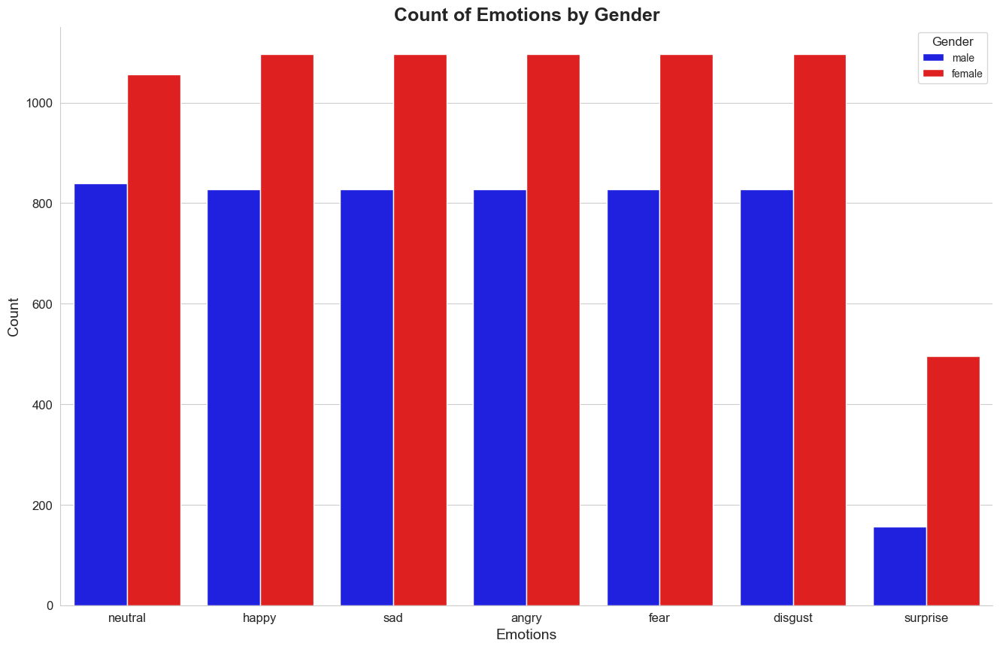

In [17]:
# Set a more visually appealing style
sns.set_style("whitegrid")

# Define a custom palette for gender
gender_palette = {'male': 'blue', 'female': 'red'}

# Plot the count plot with the custom palette
plt.figure(figsize = (16, 10))  # Increase the figure size for better readability
plt.title('Count of Emotions by Gender', size = 18, fontweight = 'bold')
sns.countplot(x = 'emotion', hue = 'gender', data = merged_df, palette = gender_palette)

# Customize labels and font sizes
plt.xlabel('Emotions', size = 14)
plt.ylabel('Count', size = 14)
plt.xticks(size = 12)
plt.yticks(size = 12)

# Add legend with better formatting
plt.legend(title = 'Gender', title_fontsize = 12, fontsize = 10)
                            
# Remove the top and right spines for a cleaner look
sns.despine(top = True, right = True)

# Display Chart
plt.show()

In [18]:
gc.collect()

449

## 3.2 Defining Function to Create Waveplot and Spectogram

In [5]:
# https://stackoverflow.com/questions/75799092/librosa-error-attributeerror-module-librosa-display-has-no-attribute-wave
# Waveplot
def create_waveplot(data, sr, e):
    plt.figure(figsize = (10, 3))
    plt.title('Waveplot for audio with {} emotion'.format(e), size = 15)
    librosa.display.waveshow(data, sr = sr)
    plt.show()

# Spectogram
def create_spectrogram(data, sr, e):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize = (12, 3))
    plt.title('Spectrogram for audio with {} emotion'.format(e), size = 15)
    librosa.display.specshow(Xdb, sr = sr, x_axis = 'time', y_axis = 'hz')   
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()

### 3.2.1 Exploring the data

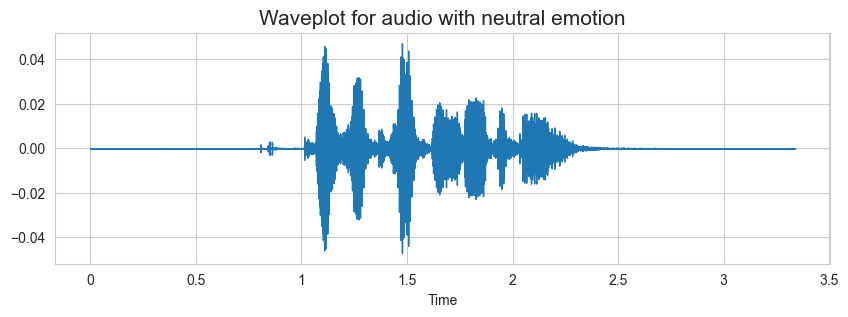

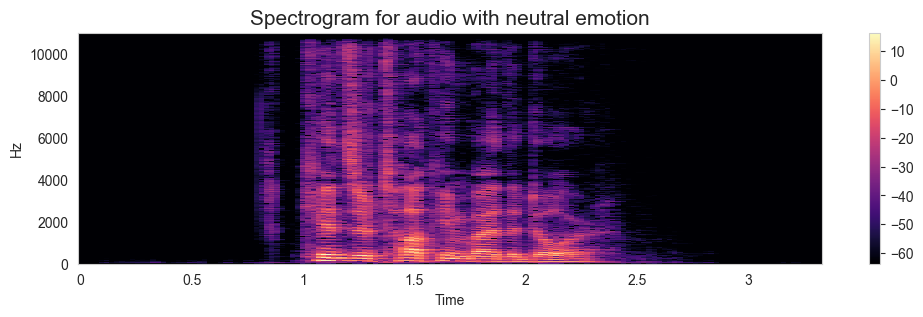

In [20]:
# Emotion
emotion = 'neutral'

# Waveplot
path = np.array(merged_df.path[merged_df.emotion == emotion])[1]
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

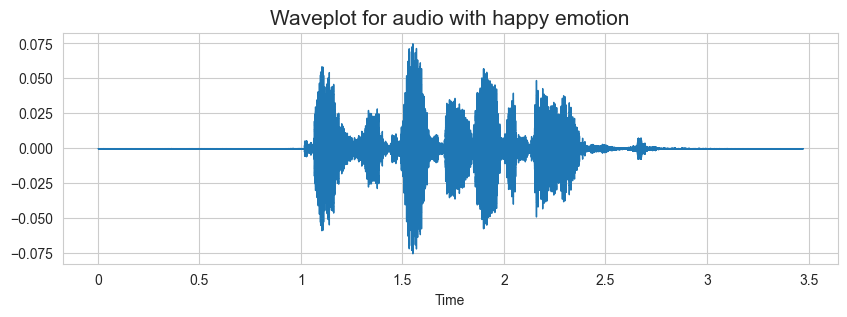

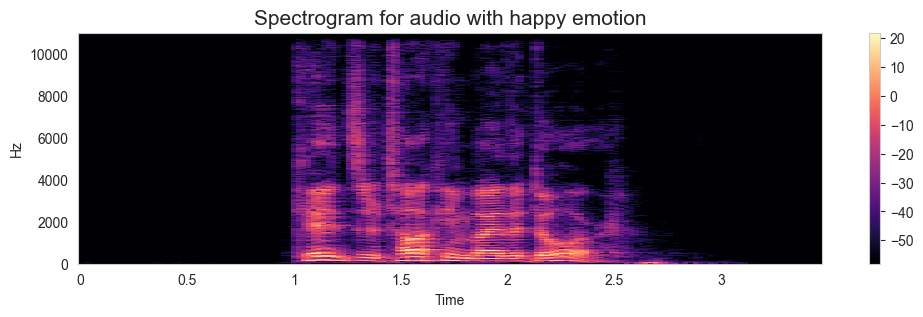

In [21]:
# Emotion
emotion = 'happy'

# Waveplot
path = np.array(merged_df.path[merged_df.emotion == emotion])[1]
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

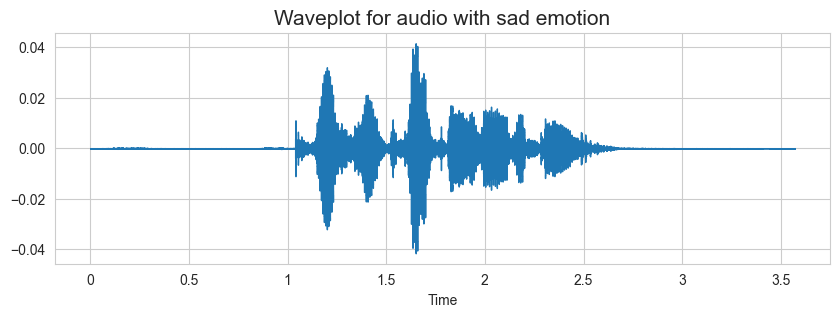

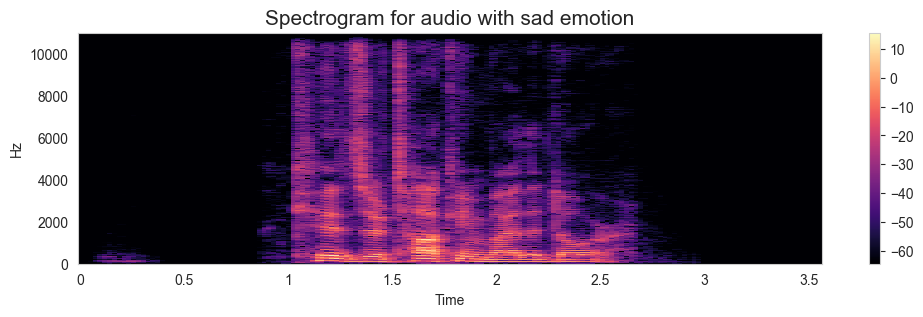

In [22]:
# Emotion
emotion = 'sad'

# Waveplot
path = np.array(merged_df.path[merged_df.emotion == emotion])[1]
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

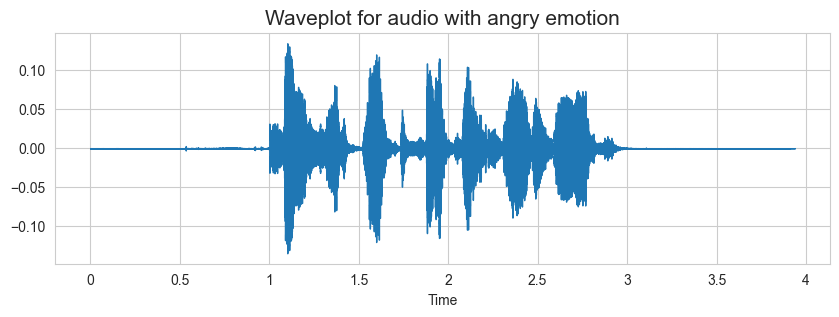

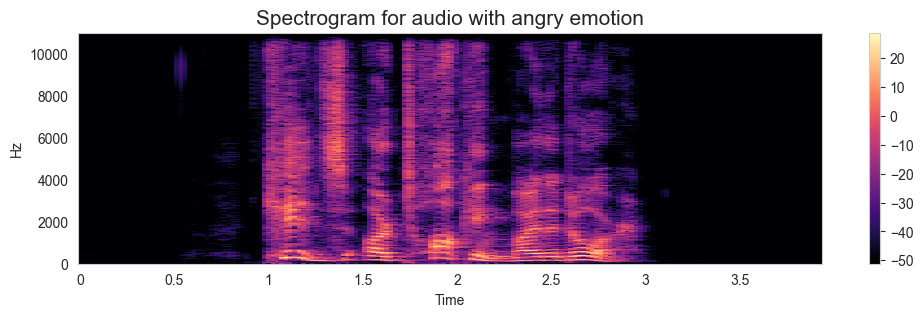

In [23]:
# Emotion
emotion = 'angry'

# Waveplot
path = np.array(merged_df.path[merged_df.emotion == emotion])[1]
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

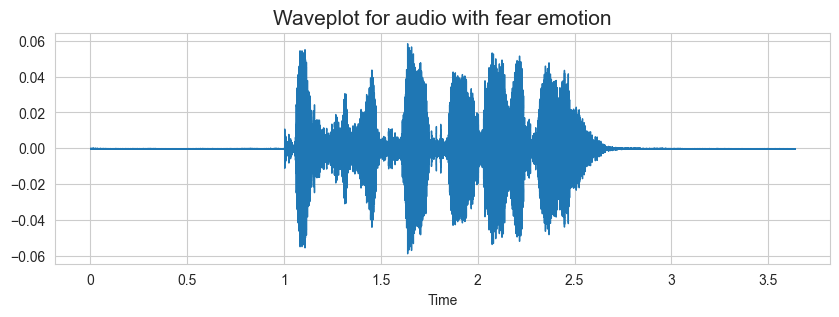

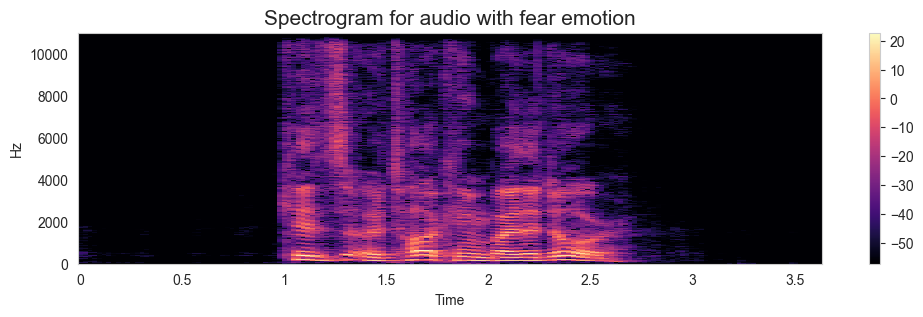

In [24]:
# Emotion
emotion = 'fear'

# Waveplot
path = np.array(merged_df.path[merged_df.emotion == emotion])[1]
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

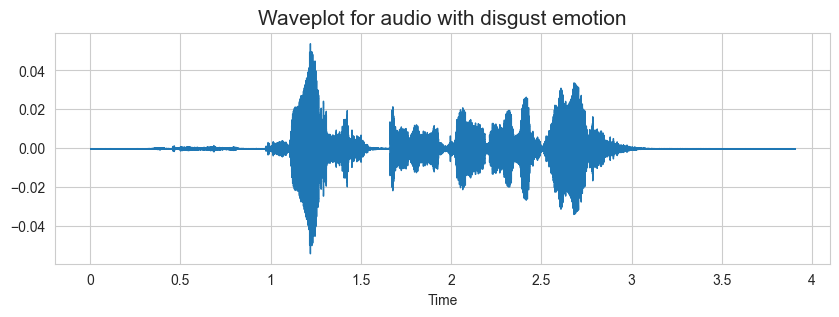

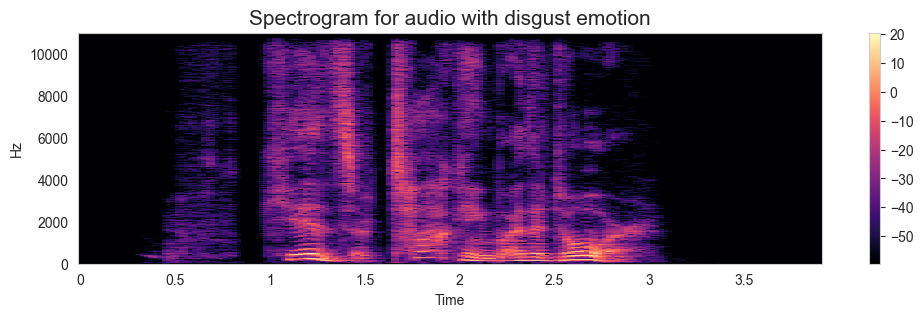

In [25]:
# Emotion
emotion = 'disgust'

# Waveplot
path = np.array(merged_df.path[merged_df.emotion == emotion])[1]
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

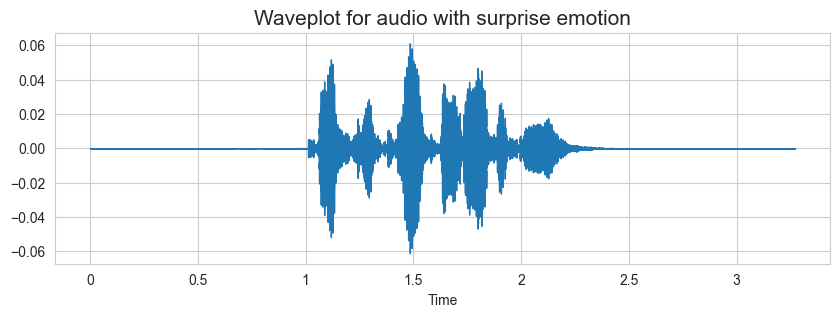

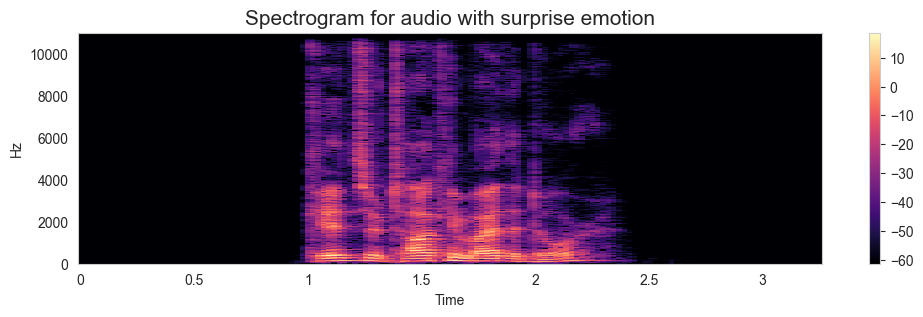

In [26]:
# Emotion
emotion = 'surprise'

# Waveplot
path = np.array(merged_df.path[merged_df.emotion == emotion])[1]
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

In [27]:
gc.collect()

59077

# 4.0: DATA PREPROCESSING

## 4.1 Defining Functions

In [28]:
# Resampling
def resample_audio(file_path, target_sr = 16000):
    
    data, sr = librosa.load(file_path, sr = None)
    
    if sr != target_sr:
        data = librosa.resample(data, orig_sr = sr, target_sr = target_sr)
        
    return data, target_sr

# Trimming
def trim_audio(data, top_db = 20):
    
    trimmed_data, _ = librosa.effects.trim(data, top_db = top_db)
    
    return trimmed_data

# Normalisation
def normalize_audio(data):
    
    max_amplitude = np.max(np.abs(data))
    
    if max_amplitude > 0:
        data = data / max_amplitude
        
    return data

# Fix audio length
def fix_audio_length(data, target_length, sr):
    
    target_samples = int(target_length * sr)
    
    if len(data) > target_samples:  # Truncate
        data = data[:target_samples]
        
    elif len(data) < target_samples:  # Pad
        
        pad_length = target_samples - len(data)
        data = np.pad(data, (0, pad_length), mode = 'constant')
        
    return data

In [29]:
# Function to process the audio: resample and normalize
def process_audio(file_path, target_sr = 16000, duration = 2.5):
    
    # Load and resample audio
    data, sr = librosa.load(file_path, sr = target_sr)

    # Trim leading/trailing silence
    data = trim_audio(data)

    # Normalize amplitude
    data = normalize_audio(data)

    # Fix the audio length to ensure consistent feature dimensions
    data = fix_audio_length(data, target_length=duration, sr=sr)

    return data, sr

## 4.2 Exploring Preprocessing Functions

In [30]:
# taking any example and checking for techniques.
emotion = 'happy'
path = np.array(merged_df.path[merged_df.emotion == emotion])[1]

### 4.2.1 Resampled Audio

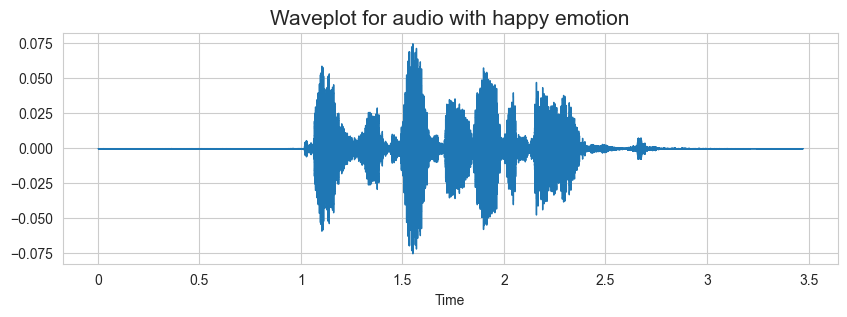

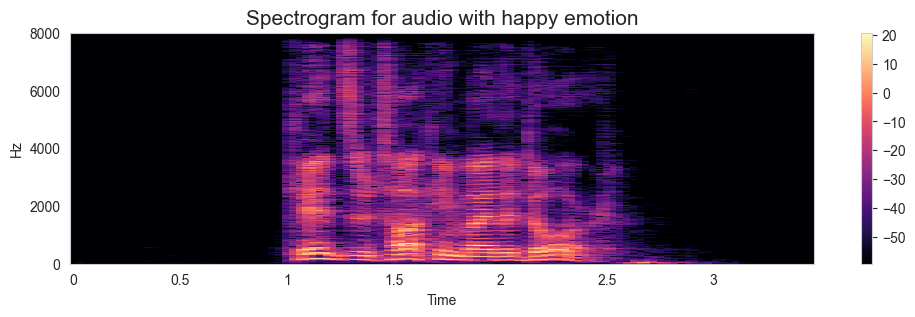

In [31]:
# Resample Audio
data, sample_rate = resample_audio(path, target_sr = 16000)

# Create and Display Waveplot and Spectrogram
create_waveplot(data, sample_rate, emotion)
create_spectrogram(data, sample_rate, emotion)

# Play the processed audio
Audio(path)

### 4.2.2 Trimming

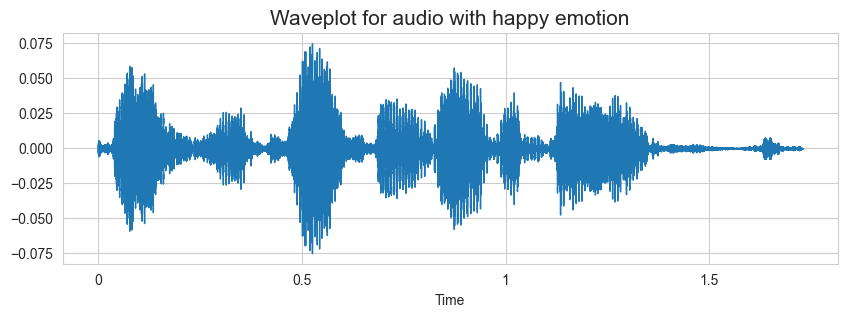

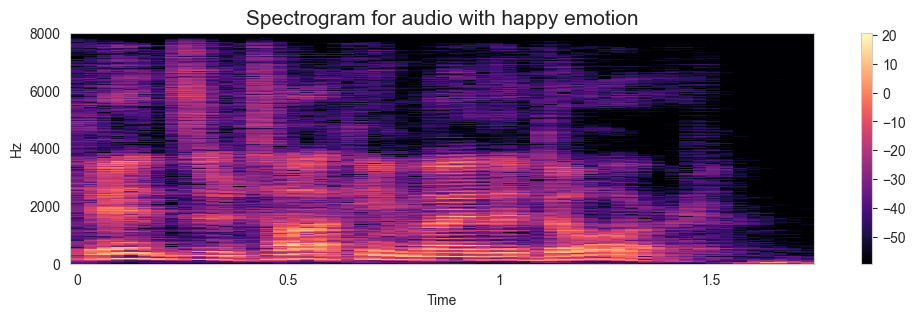

In [32]:
# Trimming Audio
data = trim_audio(data, top_db = 20)

# Create and Display Waveplot and Spectrogram
create_waveplot(data, sample_rate, emotion)
create_spectrogram(data, sample_rate, emotion)

# Play the processed audio
Audio(path)

### 4.2.3 Normalise

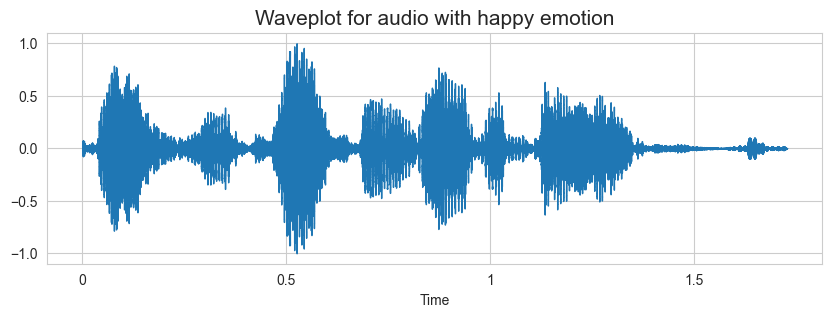

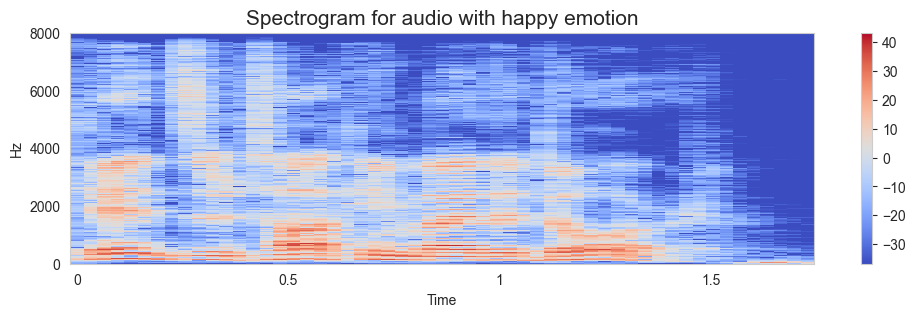

In [33]:
# Normalise Audio
data = normalize_audio(data)

# Create and Display Waveplot and Spectrogram
create_waveplot(data, sample_rate, emotion)
create_spectrogram(data, sample_rate, emotion)

# Play the processed audio
Audio(path)

### 4.2.4 Resample, Trimming and Normalising

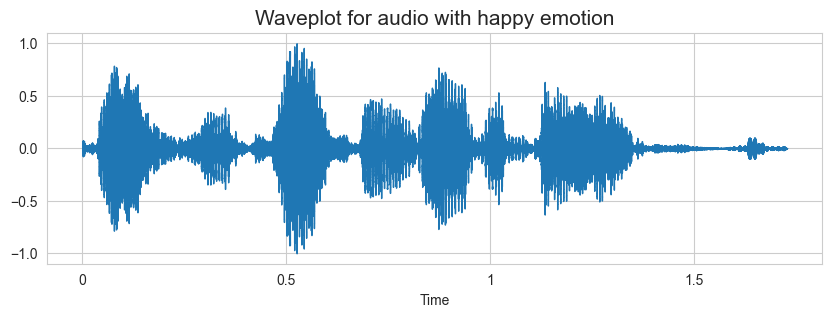

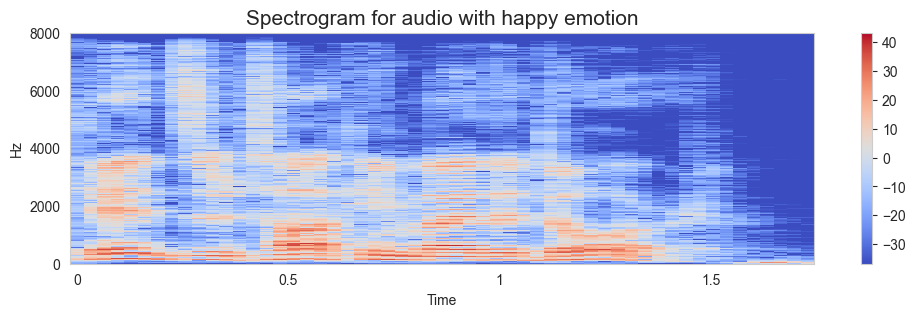

In [34]:
# Apply Preprocessing (Trimming, Resampling, Normalization)
data, sample_rate = resample_audio(path, target_sr = 16000)  # Resample audio to 16kHz
data = trim_audio(data, top_db = 20)  # Trim silence
data = normalize_audio(data)  # Normalize audio

# Create and Display Waveplot and Spectrogram
create_waveplot(data, sample_rate, emotion)
create_spectrogram(data, sample_rate, emotion)

# Play the processed audio
Audio(path)

# 5.0: DATA AUGMENTATION

## 5.1 Defining Data Augmentation Functions

In [35]:
# Noise Injection
def noise(data):
    
    noise_amp = 0.035 * np.random.uniform() * np.amax(data)
    data = data + noise_amp*np.random.normal(size = data.shape[0])
    
    return data

# Stretch
def stretch(data, rate=0.8):
    data = librosa.effects.time_stretch(data, rate=rate)
    
    return data

# Shift
def shift(data):

    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    
    return np.roll(data, shift_range)

# Pitch
def pitch(data, sampling_rate, pitch_pm = 2):

    bins_per_octave = 12
    pitch_pm = 2
    pitch_change = pitch_pm * 2 * (np.random.uniform())
    data = librosa.effects.pitch_shift(
        data,
        sr = sampling_rate,
        n_steps = pitch_change,
        bins_per_octave = bins_per_octave
    )
    
    return data

# Dyn Change
def dyn_change(data):

    dyn_change = np.random.uniform(low = -0.5 ,high = 7)  # default low = 1.5, high = 3
    
    return (data * dyn_change)

# Speed & Pitch
def speedNpitch(data):

    # you can change low and high here
    length_change = np.random.uniform(low = 0.8, high = 1)
    speed_fac = 1.2  / length_change # try changing 1.0 to 2.0 ... =D
    tmp = np.interp(np.arange(0, len(data),speed_fac),np.arange(0, len(data)),data)
    minlen = min(data.shape[0], tmp.shape[0])
    data *= 0
    data[0:minlen] = tmp[0:minlen]
    
    return data

## 5.2 Exploring Augmentation Function

In [36]:
# taking any example and checking for techniques.
path = np.array(merged_df.path)[1]
data, sample_rate = librosa.load(path)

### 5.2.1 Noise Injection

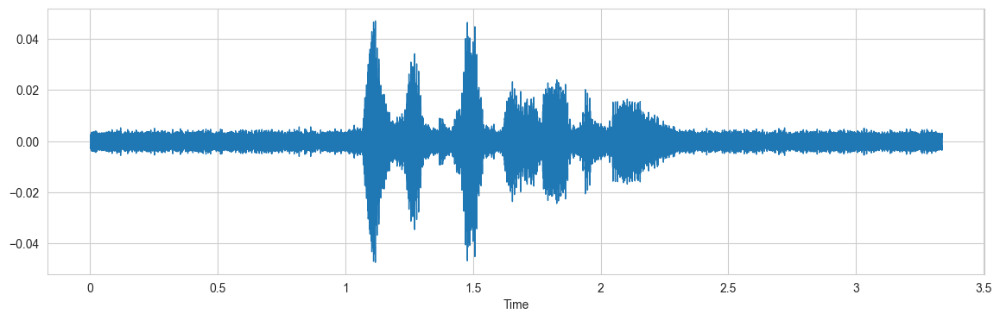

In [37]:
# Inject Noise
x = noise(data)

# Create and Display Waveplot
plt.figure(figsize = (14,4))
librosa.display.waveshow(y = x, sr = sample_rate)

# Play Audio
Audio(x, rate = sample_rate)

## 5.2.2 Stretching

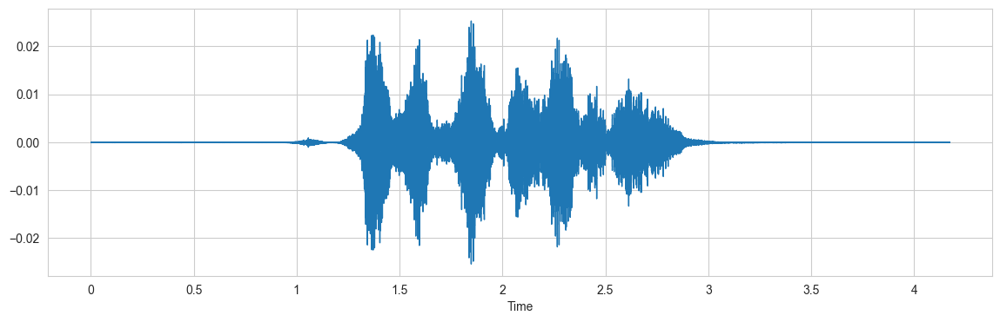

In [38]:
# Stretching
x = stretch(data)

# Create and Display Waveplot
plt.figure(figsize = (14,4))
librosa.display.waveshow(y = x, sr = sample_rate)

# Play Audio
Audio(x, rate = sample_rate)

## 5.2.3 Shifting

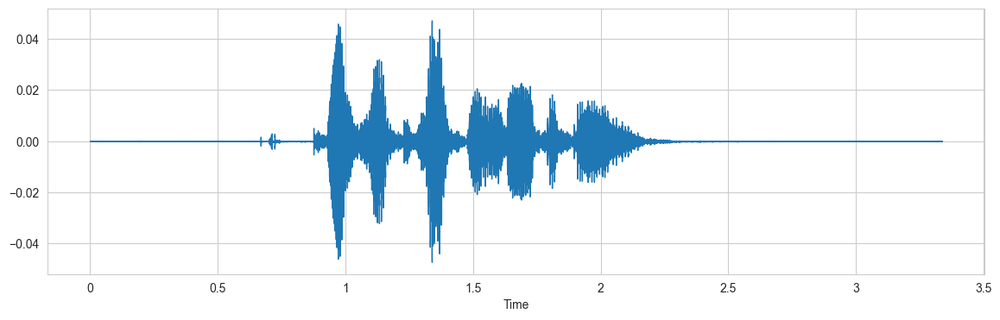

In [39]:
# Shifting
x = shift(data)

# Create and Display Waveplot
plt.figure(figsize = (14,4))
librosa.display.waveshow(y = x, sr = sample_rate)

# Play Audio
Audio(x, rate = sample_rate)

## 5.2.4 Pitching

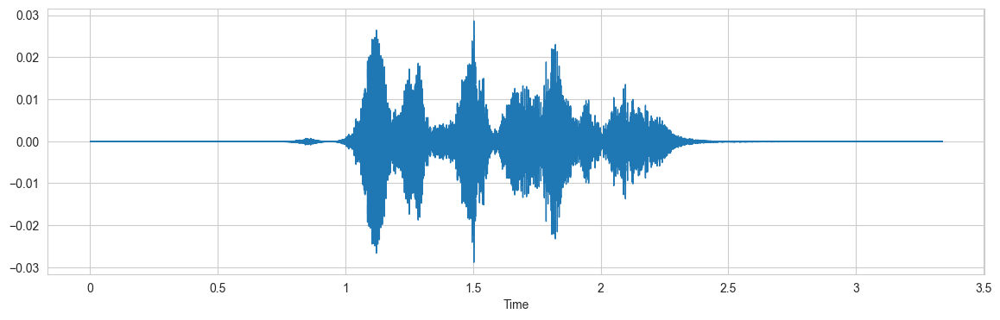

In [40]:
# Pitching
x = pitch(data, sample_rate)

# Create and Display Waveplot
plt.figure(figsize = (14,4))
librosa.display.waveshow(y = x, sr = sample_rate)

# Play Audio
Audio(x, rate = sample_rate)

### 5.2.5 Dynamic Change

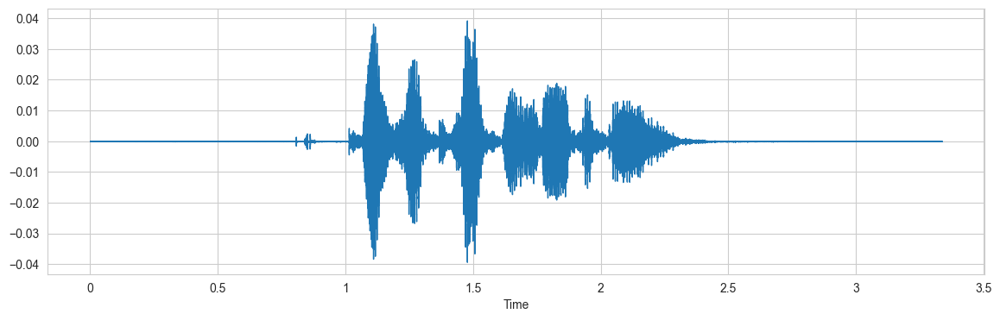

In [41]:
# Dynamic Change
x = dyn_change(data)

# Create and Display Waveplot
plt.figure(figsize = (14,4))
librosa.display.waveshow(y = x, sr = sample_rate)

# Play Audio
Audio(x, rate = sample_rate)

### 5.2.6 Speed & Pitch

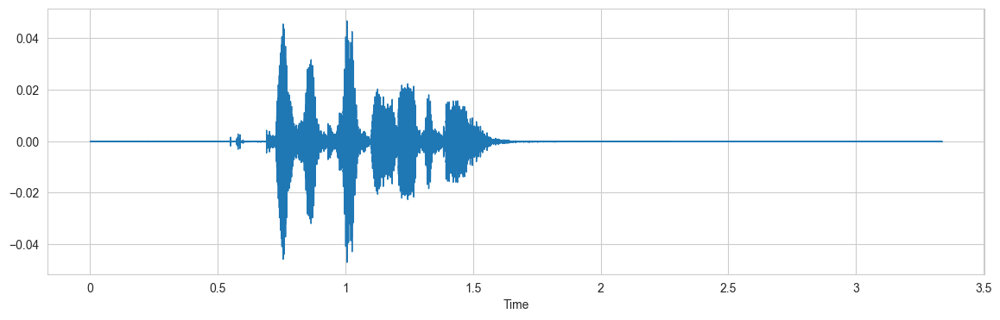

In [42]:
# Speed & Pitch
x = speedNpitch(data)

# Create and Display Waveplot
plt.figure(figsize = (14,4))
librosa.display.waveshow(y = x, sr = sample_rate)

# Play Audio
Audio(x, rate = sample_rate)

In [43]:
gc.collect()

45599

# 6.0: FEATURE EXTRACTION

## 6.1 Defining Functions

In [44]:
# Zero Crossing Rate
def zcr(data, frame_length, hop_length):
    # Perform ZCR
    zcr = librosa.feature.zero_crossing_rate(
        data,frame_length = frame_length,
        hop_length = hop_length
    )
    
    return np.squeeze(zcr)

# STFT Function
def stft(data, sr, frame_length = 2048, hop_length = 512):
    # Perform Short-Time Fourier Transform (STFT)
    stft_result = librosa.stft(
        y = data, 
        n_fft = frame_length, 
        hop_length = hop_length
    )
    
    # Convert the amplitude to decibels
    stft_db = librosa.amplitude_to_db(np.abs(stft_result), ref = np.max)
    
    return stft_db

# RMSE
def rmse(data,frame_length = 2048, hop_length = 512):
    # Perform RMSE
    rmse = librosa.feature.rms(
        y = data, 
        frame_length = frame_length, 
        hop_length = hop_length
    )
    
    return np.squeeze(rmse)

# MFCC
def mfcc(data, sr, frame_length = 2048, hop_length = 512, flatten:bool = True):
    # Perform MFCC
    mfcc = librosa.feature.mfcc(
        y = data,
        sr = sr
    )
    
    return np.squeeze(mfcc.T)if not flatten else np.ravel(mfcc.T)

# MEL
def mel_spectrogram(data, sr, n_mels = 128, frame_length = 2048, hop_length = 512):
    # Perform MEL
    mel_spect = librosa.feature.melspectrogram(
        y = data, 
        sr = sr, 
        n_mels = n_mels, 
        hop_length = hop_length, 
        n_fft = frame_length
    )
    
    return np.squeeze(mel_spect)

# 7.0 FEATURE ENGINEERING

## 7.1 Define Functions

In [45]:
def extract_features(data, sr = 22050, frame_length = 2048, hop_length = 512):

    # Initialize the result array
    result = np.array([])

    # Extract features
    # ZCR
    zcr_features = zcr(data, frame_length, hop_length)
    # # STFT
    stft_features = stft(data, frame_length, hop_length)
    # RMSE
    rmse_features = rmse(data, frame_length, hop_length)
    # MFCC
    mfcc_features = mfcc(data, sr, frame_length, hop_length)
    # # MEL
    mel_features = mel_spectrogram(data, sr, frame_length = frame_length, hop_length = hop_length)

    # Concatenate features into a 1D array
    result = np.hstack((
        result,
        zcr_features,
        stft_features.flatten(),
        rmse_features,
        mfcc_features.flatten() if mfcc_features.ndim > 1 else mfcc_features,
        mel_features.flatten() if mel_features.ndim > 1 else mel_features
    ))
    
    return result

In [46]:
def get_features(path, duration = 2.5, offset = 0.6, target_sr = 16000, frame_length = 2048, hop_length = 512):

    # Data Preprocessing
    data, sr = process_audio(path, target_sr = target_sr, duration = duration)

    # Feature Extraction
    # Extract features from the original preprocessed audio
    data,sr = librosa.load(path, duration = duration, offset = offset)
    aud_1 = extract_features(data, sr = target_sr, frame_length = frame_length, hop_length = hop_length)
    audio = np.array(aud_1)
    
    # Apply augmentations and extract features for each augmented version
    # 1. Noise Injection
    noised_audio = noise(data)
    aud_2 = extract_features(noised_audio, sr = target_sr, frame_length = frame_length, hop_length = hop_length)
    audio = np.vstack((audio, aud_2))
    
    # 2. Pitch Shift
    pitched_audio = pitch(data, sampling_rate = target_sr)
    aud_3 = extract_features(pitched_audio, sr = target_sr, frame_length = frame_length, hop_length = hop_length)
    audio = np.vstack((audio, aud_3))
    
    # 3. Pitch + Noise Combination
    pitched_audio_1 = pitch(data, sampling_rate = target_sr)
    pitched_noised_audio = noise(pitched_audio_1)
    aud_4 = extract_features(pitched_noised_audio, sr = target_sr, frame_length = frame_length, hop_length = hop_length)
    audio = np.vstack((audio, aud_4))
    
    return audio

In [47]:
# Define a function to get features for a single audio file
def process_feature(path, emotion):
    
    features = get_features(path)
    
    X = []
    Y = []
    
    for ele in features:
        X.append(ele)
        
        # appending emotion 3 times as we have made 3 augmentation techniques on each audio file.
        Y.append(emotion)
    
    return X, Y

## 7.2 Extracting Features

In [48]:
# Collect the results in parallel
start = timeit.default_timer()

paths = merged_df.path
emotions = merged_df.emotion

# Run the loop in parallel
results = Parallel(n_jobs = -1)(delayed(process_feature)(path, emotion) for (path, emotion) in zip(paths, emotions))

# Collect the results
X = []
Y = []

for result in results:
    x, y = result
    X.extend(x)
    Y.extend(y)

stop = timeit.default_timer()

print('Time: ', stop - start)

Time:  314.48309979999976


In [49]:
len(X), len(Y), merged_df.path.shape

(48648, 48648, (12162,))

## 7.3 Saving Features

In [50]:
# Creating Data Frame to Store Features
Features = pd.DataFrame(X)
Features['emotion'] = Y
Features.to_csv('./SER_DataFrame/features.csv', index = False)
Features.head()

,0,1,2,3,4,5,6,7,8,9,...,2367,2368,2369,2370,2371,2372,2373,2374,2375,emotion
0,0.173828,0.264648,0.372559,0.486328,0.625488,0.681152,0.720703,0.651855,0.562988,0.559082,...,1.356652,1.340976,1.324067,1.305952,1.286668,1.266239,1.244731,1.222154,1.198559,neutral
1,0.243164,0.378418,0.498535,0.500488,0.496094,0.487305,0.496094,0.501953,0.510742,0.512207,...,1.996986,3.808192,2.763120,0.114583,-0.677703,3.198701,2.425094,1.446792,3.652324,neutral
2,0.270508,0.374512,0.472168,0.418457,0.361328,0.347168,0.346191,0.391113,0.459961,0.523438,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,neutral
3,0.261230,0.386230,0.505859,0.484863,0.481445,0.470703,0.480957,0.481445,0.486816,0.501953,...,0.857919,5.369679,1.959937,2.316066,4.946008,3.034859,-0.883816,-2.371642,-1.317106,neutral
4,0.247070,0.389648,0.564941,0.642578,0.665527,0.684570,0.676270,0.666992,0.648926,0.595703,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,neutral


In [5]:
# Loading the Dataset 
Features = pd.read_csv('./SER_DataFrame/features.csv')
Features.head()

,0,1,2,3,4,5,6,7,8,9,...,2367,2368,2369,2370,2371,2372,2373,2374,2375,emotion
0,0.173828,0.264648,0.372559,0.486328,0.625488,0.681152,0.720703,0.651855,0.562988,0.559082,...,1.356652,1.340976,1.324067,1.305952,1.286668,1.266239,1.244731,1.222154,1.198559,neutral
1,0.243164,0.378418,0.498535,0.500488,0.496094,0.487305,0.496094,0.501953,0.510742,0.512207,...,1.996986,3.808192,2.763120,0.114583,-0.677703,3.198701,2.425094,1.446792,3.652324,neutral
2,0.270508,0.374512,0.472168,0.418457,0.361328,0.347168,0.346191,0.391113,0.459961,0.523438,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,neutral
3,0.261230,0.386230,0.505859,0.484863,0.481445,0.470703,0.480957,0.481445,0.486816,0.501953,...,0.857919,5.369679,1.959937,2.316066,4.946008,3.034859,-0.883816,-2.371642,-1.317106,neutral
4,0.247070,0.389648,0.564941,0.642578,0.665527,0.684570,0.676270,0.666992,0.648926,0.595703,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,neutral


In [6]:
print(Features.isna().any())

0          False
1          False
2          False
3          False
4          False
           ...  
2372        True
2373        True
2374        True
2375        True
emotion    False
Length: 2377, dtype: bool


In [7]:
Features = Features.fillna(0)
print(Features.isna().any())
Features.shape

0          False
1          False
2          False
3          False
4          False
           ...  
2372       False
2373       False
2374       False
2375       False
emotion    False
Length: 2377, dtype: bool


(48648, 2377)

In [8]:
print(Features.isna().any())

0          False
1          False
2          False
3          False
4          False
           ...  
2372       False
2373       False
2374       False
2375       False
emotion    False
Length: 2377, dtype: bool


In [9]:
# taking all rows and all cols without last col for X which include features
# taking last col for Y, which include the emotions
X = Features.iloc[: ,:-1].values
Y = Features['emotion'].values

## 7.4 Class Weight

In [10]:
np.unique(Y)

array(['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'],
      dtype=object)

In [11]:
class_labels = np.unique(Y)

class_weights = compute_class_weight(
    class_weight = 'balanced',
    classes = np.array(class_labels),
    y = Y
)

class_weights = dict(enumerate(class_weights))

In [12]:
print(class_weights)

{0: 0.9034989971027413, 1: 0.9034989971027413, 2: 0.9034989971027413, 3: 0.9034989971027413, 4: 0.9168488503580852, 5: 0.9034989971027413, 6: 2.6647677475898335}


## 7.5 OneHot Encoding

In [13]:
# As this is a multiclass classification problem onehotencoding our Y.
encoder = OneHotEncoder()
Y = encoder.fit_transform(np.array(Y).reshape(-1, 1)).toarray()

In [14]:
# Saving encoder
with open('ser_encoder.pkl', 'wb') as encode:
    joblib.dump(encoder, encode)

print("Encoder Saved Successfully")

Encoder Saved Successfully


## 7.5 Oversampling

In [10]:
# # Class distribution before resampling
# print("Class distribution before resampling: ", Counter(np.argmax(Y, axis = 1)))

Class distribution before resampling:  Counter({3: 7692, 5: 7692, 0: 7692, 2: 7692, 1: 7692, 4: 7580, 6: 2608})


In [11]:
# # SMOTE Oversampling (to handle class imbalance)
# smote = SMOTE(random_state = 42)
# X, Y = smote.fit_resample(X, Y)

In [12]:
# # Class distribution after resampling (SMOTE)
# print("Class distribution after resampling: ", Counter(np.argmax(Y, axis = 1)))

Class distribution after resampling:  Counter({4: 7692, 3: 7692, 5: 7692, 0: 7692, 2: 7692, 1: 7692, 6: 7692})


## 7.8 Data Scaling

In [15]:
# scaling our data with sklearn's Standard scaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [16]:
X_scaled.shape

(48648, 2376)

In [17]:
# Saving scaler
with open('ser_scaler.pkl', "wb") as scale:
    joblib.dump(scaler, scale)

print("Scaler Saved Successfully")

Scaler Saved Successfully


## 7.7 Recreating Training & Testing 

In [18]:
# splitting data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, Y, random_state = 33, test_size = 0.2, shuffle = True)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((38918, 2376), (38918, 7), (9730, 2376), (9730, 7))

# 8.0: MODELLING

In [19]:
class cfg:
    INPUT_SHAPE = (X_train.shape[1], 1)
    BATCH_SIZE = 64
    EPOCHS = 100
    NUM_CLASSES = 7

In [20]:
# Save Model Checkpoint
def get_checkpoint_callback(model_path, model_name):
    
    # Create a directory for saving checkpoints
    model_name = model_name
    chk_point_dir = os.path.join(model_path, "checkpoints")
    os.makedirs(chk_point_dir, exist_ok = True)

    # Add a timestamp for uniqueness
    timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    filepath = os.path.join(chk_point_dir, f"{model_name}_{timestamp}_checkpoint.h5")

    # Return a ModelCheckpoint callback with the generated filepath
    return ModelCheckpoint(
        filepath = filepath,
        save_best_only = True,
        verbose = 1,
        mode = "max",
        monitor = "val_accuracy"
)

In [21]:
# Early Stopping
early_stopping = EarlyStopping(
    restore_best_weights = True,
    min_delta = 0.0001,  # Min change in the monitored quantity to qualify as an improvement
    patience = 7,  # Number of epochs with no improvement
    verbose = 1, 
    mode = "min",
    monitor = "val_loss"
)

# RLRP
rlrp = ReduceLROnPlateau(
    factor = 0.5,  # Factor by which LR will be reduced
    patience = 5,
    verbose = 1,
    min_delta = 0.0001,  # Threshold for measuring the new optimum
    mode = "min",
    monitor = "val_loss"
)

In [22]:
# Defining Optimizer
optimizer = adam_v2.Adam(learning_rate = 3e-4)

## 8.1 CNN Model

In [24]:
# Clear the previous TensorFlow sessionx
tf.keras.backend.clear_session()

In [25]:
# Reshape for CNN
X_train_cnn = np.expand_dims(X_train, axis = 2)
X_test_cnn = np.expand_dims(X_test, axis = 2)
X_train_cnn.shape, y_train.shape, X_test_cnn.shape, y_test.shape

((38918, 2376, 1), (38918, 7), (9730, 2376, 1), (9730, 7))

In [26]:
# Define Neurons
L1 = 128
L2 = 256
L3 = 512
L4 = 1024

# Building 1D CNN Model
base_cnn = tf.keras.Sequential([

    # Input Layer
    L.Conv1D(L3, kernel_size = 7, strides = 1, padding = 'same', activation = 'relu', input_shape = cfg.INPUT_SHAPE,
            kernel_initializer = "HeNormal"),
    L.BatchNormalization(),
    L.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'),

    # Hidden Layer 1
    L.Conv1D(L3, kernel_size = 5, padding = 'same', activation = 'relu', kernel_initializer = "HeNormal",
            kernel_regularizer = tf.keras.regularizers.l2(0.001)),
    L.BatchNormalization(),
    L.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'),
    L.Dropout(0.3),  # Add dropout layer after the second max pooling layer

    # Hidden Layer 2
    L.Conv1D(L2, kernel_size = 5, padding = 'same', activation = 'relu', kernel_initializer = "HeNormal",
            kernel_regularizer = tf.keras.regularizers.l2(0.001)),
    L.BatchNormalization(),
    L.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'),
    L.Dropout(0.3),  # Add dropout layer after the second max pooling layer

    # Hidden Layer 3
    L.Conv1D(L2, kernel_size = 5, padding = 'same', activation = 'relu', kernel_initializer = "HeNormal",
            kernel_regularizer = tf.keras.regularizers.l2(0.001)),
    L.BatchNormalization(),
    L.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'),
    L.Dropout(0.3),  # Add dropout layer after the second max pooling layer

    # Hidden Layer 4
    L.Conv1D(L1, kernel_size = 3, strides = 1, padding = 'same', activation = 'relu', kernel_initializer = "HeNormal",
            kernel_regularizer = tf.keras.regularizers.l2(0.001)),
    L.BatchNormalization(),
    L.MaxPool1D(pool_size = 5, strides = 2, padding = 'same'),
    L.Dropout(0.3),  # Add dropout layer after the fourth max pooling layer

    # Fully Connected Layer
    L.Flatten(),
    L.Dense(L4, activation = 'relu'),
    L.BatchNormalization(),
    L.Dropout(0.3),
    L.Dense(cfg.NUM_CLASSES, activation = 'softmax')
])

# Summary of the model
base_cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 2376, 512)         4096      
                                                                 
 batch_normalization (BatchN  (None, 2376, 512)        2048      
 ormalization)                                                   
                                                                 
 max_pooling1d (MaxPooling1D  (None, 1188, 512)        0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 1188, 512)         1311232   
                                                                 
 batch_normalization_1 (Batc  (None, 1188, 512)        2048      
 hNormalization)                                                 
                                                        

In [27]:
# Define Model Path
model_name = "Baseline_CNN"
model_path = os.path.join("models", model_name)

# Define Checkpoint Path
chk_point = get_checkpoint_callback(model_path, model_name)

# Define CSV Path
csv_logger = CSVLogger(os.path.join(model_path, "logs/training_log.csv"))

In [28]:
# Compiling Model
base_cnn.compile(
    loss = 'categorical_crossentropy', 
    optimizer = optimizer, 
    metrics = ['accuracy']
)

In [28]:
# Define Callbacks
callbacks = [chk_point, early_stopping, rlrp, csv_logger]

# Training Model
base_cnn_hist = base_cnn.fit(
    X_train_cnn, y_train, 
    batch_size = cfg.BATCH_SIZE, 
    epochs = cfg.EPOCHS, 
    validation_data = (X_test_cnn, y_test),
    callbacks = callbacks,
    class_weight = class_weights
)

Epoch 1/100
609/609 [==============================] - ETA: 0s - loss: 3.8444 - accuracy: 0.3905
Epoch 1: val_accuracy improved from -inf to 0.18325, saving model to models\Baseline_CNN\checkpoints\Baseline_CNN_20250131-192708_checkpoint.h5
609/609 [==============================] - 130s 197ms/step - loss: 3.8444 - accuracy: 0.3905 - val_loss: 11.0329 - val_accuracy: 0.1832 - lr: 3.0000e-04
Epoch 2/100
608/609 [============================>.] - ETA: 0s - loss: 3.0972 - accuracy: 0.4830
Epoch 2: val_accuracy improved from 0.18325 to 0.22980, saving model to models\Baseline_CNN\checkpoints\Baseline_CNN_20250131-192708_checkpoint.h5
609/609 [==============================] - 118s 194ms/step - loss: 3.0973 - accuracy: 0.4830 - val_loss: 14.6863 - val_accuracy: 0.2298 - lr: 3.0000e-04
Epoch 3/100
608/609 [============================>.] - ETA: 0s - loss: 2.5318 - accuracy: 0.5272
Epoch 3: val_accuracy did not improve from 0.22980
609/609 [==============================] - 118s 194ms/step - 

## 8.2 BiLSTM

In [23]:
# Clear the previous TensorFlow sessionx
tf.keras.backend.clear_session()

In [24]:
# Define Neurons
L1 = 64
L2 = 128
L3 = 256
L4 = 512

# Build Bi-LSTM Model
base_bi_lstm = tf.keras.Sequential([

    # Input Layer (LSTM needs 3D input: (batch_size, timesteps, features))
    L.Input(shape = cfg.INPUT_SHAPE),

    # Bidirectional LSTM Layer 1
    L.Bidirectional(L.LSTM(L1, return_sequences = True, dropout = 0.3, 
                           kernel_regularizer = tf.keras.regularizers.l2(0.001))),
    L.BatchNormalization(),

    # Bidirectional LSTM Layer 2
    L.Bidirectional(L.LSTM(L2, return_sequences = True, dropout = 0.3, 
                           kernel_regularizer = tf.keras.regularizers.l2(0.001))),
    L.BatchNormalization(),

    # Bidirectional LSTM Layer 3
    L.Bidirectional(L.LSTM(L3, return_sequences = False, dropout = 0.3, 
                           kernel_regularizer = tf.keras.regularizers.l2(0.001))),
    L.BatchNormalization(),

    # Fully Connected Layers
    L.Dense(L4, activation = "relu"),
    L.BatchNormalization(),
    L.Dropout(0.3),

    # Output Layer
    L.Dense(cfg.NUM_CLASSES, activation = "softmax")
])

base_bi_lstm.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirectiona  (None, 2376, 128)        33792     
 l)                                                              
                                                                 
 batch_normalization (BatchN  (None, 2376, 128)        512       
 ormalization)                                                   
                                                                 
 bidirectional_1 (Bidirectio  (None, 2376, 256)        263168    
 nal)                                                            
                                                                 
 batch_normalization_1 (Batc  (None, 2376, 256)        1024      
 hNormalization)                                                 
                                                                 
 bidirectional_2 (Bidirectio  (None, 512)              1

In [25]:
# Compiling Model
base_bi_lstm.compile(
    loss = 'categorical_crossentropy', 
    optimizer = optimizer, 
    metrics = ['accuracy']
)

In [26]:
# Define Model Path
model_name = "Bi-LSTM"
model_path = os.path.join("models", model_name)

# Define Checkpoint Path
chk_point = get_checkpoint_callback(model_path, model_name)

# Define CSV Path
csv_logger = CSVLogger(os.path.join(model_path, "logs/training_log.csv"))

## 8.3 Bi-GRU

In [23]:
# Clear the previous TensorFlow sessionx
tf.keras.backend.clear_session()

In [24]:
# Define Neurons (Reduced for Lower Memory)
L1 = 64
L2 = 128
L3 = 256
L4 = 512

# Input Layer
inputs = L.Input(shape = cfg.INPUT_SHAPE)

# GRU with Residual 
x = L.Bidirectional(L.GRU(L1, return_sequences = True, dropout = 0.2, 
                           kernel_regularizer = tf.keras.regularizers.l2(0.0001)))(inputs)
x = L.LayerNormalization()(x)  # Memory-efficient normalization

# Multi-Head Self-Attention
attn = L.MultiHeadAttention(num_heads = 2, key_dim = L1)(x, x)
attn = L.Add()([x, attn])  # Residual Connection
attn = L.LayerNormalization()(attn)

# Bi-GRU Layers
x = L.Bidirectional(L.GRU(L2, return_sequences = True, dropout = 0.2))(attn)
x = L.LayerNormalization()(x)

# Attention Layer
attn2 = L.MultiHeadAttention(num_heads = 2, key_dim = L2)(x, x)
attn2 = L.Add()([x, attn2])  # Residual Connection
attn2 = L.LayerNormalization()(attn2)

# Final Bi-GRU Layer
x = L.Bidirectional(L.GRU(L3, return_sequences = False, dropout = 0.2))(attn2)
x = L.LayerNormalization()(x)

# Fully Connected Layers
x = L.Dense(L4, activation = "swish")(x)
x = L.LayerNormalization()(x)
x = L.Dropout(0.2)(x)  # Reduced dropout

x = L.Dense(L3, activation = "swish")(x)
x = L.LayerNormalization()(x)
x = L.Dropout(0.2)(x)

# Output Layer
outputs = L.Dense(cfg.NUM_CLASSES, activation = "softmax")(x)

# Define Model
base_bi_gru = tf.keras.Model(inputs, outputs)

# Summary
base_bi_gru.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 2376, 1)]    0           []                               
                                                                                                  
 bidirectional (Bidirectional)  (None, 2376, 128)    25728       ['input_1[0][0]']                
                                                                                                  
 layer_normalization (LayerNorm  (None, 2376, 128)   256         ['bidirectional[0][0]']          
 alization)                                                                                       
                                                                                                  
 multi_head_attention (MultiHea  (None, 2376, 128)   66048       ['layer_normalization[0][0]',

In [25]:
# Compile Model
base_bi_gru.compile(
    optimizer = optimizer,
    loss = "categorical_crossentropy",
    metrics = ["accuracy"]
)

In [26]:
# Define Model Path
model_name = "Bi-GRU"
model_path = os.path.join("models", model_name)

# Define Checkpoint Path
chk_point = get_checkpoint_callback(model_path, model_name)

# Define CSV Path
csv_logger = CSVLogger(os.path.join(model_path, "logs/training_log.csv"))

In [28]:
# Define Callbacks
callbacks = [chk_point, early_stopping, rlrp, csv_logger]

# Training lSTM Model
base_bi_gru_hist = base_bi_gru.fit(
    X_train, y_train,
    batch_size = 8,
    epochs = 20,
    validation_data = (X_test, y_test), 
    verbose = 1,
    callbacks = callbacks, 
    class_weight = class_weights
)

Epoch 1/20
4865/4865 [==============================] - ETA: 0s - loss: 1.7427 - accuracy: 0.2682
Epoch 1: val_accuracy improved from -inf to 0.35128, saving model to models\Bi-GRU\checkpoints\Bi-GRU_20250216-161702_checkpoint.h5
4865/4865 [==============================] - 3668s 754ms/step - loss: 1.7427 - accuracy: 0.2682 - val_loss: 1.6014 - val_accuracy: 0.3513 - lr: 3.0000e-04
Epoch 2/20
4865/4865 [==============================] - ETA: 0s - loss: 1.4672 - accuracy: 0.3826
Epoch 2: val_accuracy improved from 0.35128 to 0.42076, saving model to models\Bi-GRU\checkpoints\Bi-GRU_20250216-161702_checkpoint.h5
4865/4865 [==============================] - 3710s 763ms/step - loss: 1.4672 - accuracy: 0.3826 - val_loss: 1.4305 - val_accuracy: 0.4208 - lr: 3.0000e-04
Epoch 3/20
4865/4865 [==============================] - ETA: 0s - loss: 1.3503 - accuracy: 0.4379
Epoch 3: val_accuracy improved from 0.42076 to 0.44368, saving model to models\Bi-GRU\checkpoints\Bi-GRU_20250216-161702_checkpoi

## 8.4 CNN-Bi-LSTM

In [26]:
# Clear the previous TensorFlow sessionx
tf.keras.backend.clear_session()

In [27]:
# Define Neurons
L1 = 256
L2 = 512
L3 = 1024

# Input Layer
inputs = L.Input(shape=cfg.INPUT_SHAPE)

# CNN Feature Extractor with Residual Connections
x = L.Conv1D(L3, kernel_size=7, strides=1, padding="same", activation="relu")(inputs)
x = L.BatchNormalization()(x)
x = L.MaxPooling1D(pool_size=4, strides=2, padding="same")(x)

residual = x  # Save for residual connection

x = L.Conv1D(L2, kernel_size=5, padding="same", activation="relu", kernel_regularizer=tf.keras.regularizers.l2(0.0005))(x)
x = L.BatchNormalization()(x)
x = L.MaxPooling1D(pool_size=4, strides=2, padding="same")(x)
x = L.Dropout(0.3)(x)

# Residual Connection (CNN)
if residual.shape[-1] == x.shape[-1]:  # Ensure same shape before adding
    x = L.Add()([x, residual])

residual = x  # Save for another residual connection

x = L.Conv1D(L1, kernel_size=3, padding="same", activation="relu", kernel_regularizer=tf.keras.regularizers.l2(0.0005))(x)
x = L.BatchNormalization()(x)
x = L.MaxPooling1D(pool_size=5, strides=2, padding="same")(x)
x = L.Dropout(0.3)(x)

# Residual Connection (CNN)
if residual.shape[-1] == x.shape[-1]:  # Ensure same shape before adding
    x = L.Add()([x, residual])

# Reduce Dimensionality
x = L.GlobalAveragePooling1D()(x)

# Reshape for LSTM (Expanding Time Steps Correctly)
x = L.RepeatVector(10)(x)  # Converts (batch, features) → (batch, timesteps, features)

# BiLSTM with Multi-Head Attention
lstm1 = L.Bidirectional(L.LSTM(L1, return_sequences=True, dropout=0.3))(x)
lstm1 = L.LayerNormalization()(lstm1)

lstm2 = L.Bidirectional(L.LSTM(L1, return_sequences=True, dropout=0.3))(lstm1)
lstm2 = L.LayerNormalization()(lstm2)

# Multi-Head Attention (Better than L.Attention)
attn = L.MultiHeadAttention(num_heads=4, key_dim=L1)(lstm2, lstm2)
attn = L.Add()([attn, lstm2])  # Residual Connection after Attention

# Final LSTM Layer
lstm3 = L.Bidirectional(L.LSTM(L1, return_sequences=False, dropout=0.3))(attn)
lstm3 = L.LayerNormalization()(lstm3)

# Fully Connected Layers
fc1 = L.Dense(L3, activation="relu")(lstm3)
fc1 = L.BatchNormalization()(fc1)
fc1 = L.Dropout(0.3)(fc1)

fc2 = L.Dense(L2, activation="relu")(fc1)
fc2 = L.BatchNormalization()(fc2)
fc2 = L.Dropout(0.3)(fc2)

# Output Layer
outputs = L.Dense(cfg.NUM_CLASSES, activation="softmax")(fc2)

# Define Model
base_cnn_bi_lstm = tf.keras.Model(inputs, outputs)

# Summary
base_cnn_bi_lstm.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 2376, 1)]    0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 2376, 1024)   8192        ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 2376, 1024)  4096        ['conv1d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 max_pooling1d (MaxPooling1D)   (None, 1188, 1024)   0           ['batch_normalization[0][0]']

In [28]:
# Compile Model
base_cnn_bi_lstm.compile(
    optimizer = optimizer,
    loss = "categorical_crossentropy",
    metrics = ["accuracy"]
)

In [29]:
# Define Model Path
model_name = "CNN-Bi-LSTM"
model_path = os.path.join("models", model_name)

# Define Checkpoint Path
chk_point = get_checkpoint_callback(model_path, model_name)

# Define CSV Path
csv_logger = CSVLogger(os.path.join(model_path, "logs/training_log.csv"))

In [30]:
# Define Callbacks
callbacks = [chk_point, early_stopping, rlrp, csv_logger]

# Training lSTM Model
base_cnn_bi_lstm_hist = base_cnn_bi_lstm.fit(
    X_train, y_train,
    batch_size = cfg.BATCH_SIZE,
    epochs = cfg.EPOCHS,
    validation_data = (X_test, y_test), 
    verbose = 1,
    callbacks = callbacks, 
    class_weight = class_weights
)

Epoch 1/100
609/609 [==============================] - ETA: 0s - loss: 2.5514 - accuracy: 0.2540
Epoch 1: val_accuracy improved from -inf to 0.29096, saving model to models\CNN-Bi-LSTM\checkpoints\CNN-Bi-LSTM_20250215-174444_checkpoint.h5
609/609 [==============================] - 232s 328ms/step - loss: 2.5514 - accuracy: 0.2540 - val_loss: 2.2365 - val_accuracy: 0.2910 - lr: 3.0000e-04
Epoch 2/100
609/609 [==============================] - ETA: 0s - loss: 2.0137 - accuracy: 0.3563
Epoch 2: val_accuracy improved from 0.29096 to 0.39517, saving model to models\CNN-Bi-LSTM\checkpoints\CNN-Bi-LSTM_20250215-174444_checkpoint.h5
609/609 [==============================] - 194s 318ms/step - loss: 2.0137 - accuracy: 0.3563 - val_loss: 1.8734 - val_accuracy: 0.3952 - lr: 3.0000e-04
Epoch 3/100
609/609 [==============================] - ETA: 0s - loss: 1.7652 - accuracy: 0.4017
Epoch 3: val_accuracy did not improve from 0.39517
609/609 [==============================] - 194s 319ms/step - loss: 

## 8.5 Transformer 

In [51]:
# Construct Positional Encoding
def positional_encoding(seq_length, d_model):
    
    pos = np.arange(seq_length)[:, np.newaxis]
    i = np.arange(d_model)[np.newaxis, :]
    angles = pos / np.power(10000, (2 * (i // 2)) / np.float32(d_model))
    
    pos_encoding = np.zeros((seq_length, d_model))
    pos_encoding[:, 0::2] = np.sin(angles[:, 0::2])  # Apply sine to even indices
    pos_encoding[:, 1::2] = np.cos(angles[:, 1::2])  # Apply cosine to odd indices
    
    return tf.constant(pos_encoding, dtype = tf.float32)

In [52]:
# Transformer Block
class TransformerBlock(tf.keras.layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate = 0.1, **kwargs):
        
        super(TransformerBlock, self).__init__(**kwargs)
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.ff_dim = ff_dim
        self.rate = rate

        # Multi-Head Attention
        self.att = L.MultiHeadAttention(num_heads = num_heads, key_dim = embed_dim)

        # Feed Forward Network
        self.ffn = tf.keras.Sequential([
            L.Dense(ff_dim, activation = "relu", kernel_regularizer = tf.keras.regularizers.l2(0.001)),
            L.Dense(embed_dim)
        ])

        # Pre-Normalization & Dropout Layers
        self.layernorm1 = L.LayerNormalization(epsilon = 1e-6)
        self.layernorm2 = L.LayerNormalization(epsilon = 1e-6)
        self.dropout1 = L.Dropout(rate)
        self.dropout2 = L.Dropout(rate)

    def call(self, inputs, training = False):
        
        norm_inputs = self.layernorm1(inputs)  # Pre-Norm improves stability
        attn_output = self.att(norm_inputs, norm_inputs)
        attn_output = self.dropout1(attn_output, training = training)
        out1 = inputs + attn_output  # Residual Connection

        norm_out1 = self.layernorm2(out1)  # Normalize before FFN
        ffn_output = self.ffn(norm_out1)
        ffn_output = self.dropout2(ffn_output, training = training)
        
        return out1 + ffn_output  # Residual Connection

    def get_config(self):
        config = super().get_config()
        config.update({
            "embed_dim": self.embed_dim,
            "num_heads": self.num_heads,
            "ff_dim": self.ff_dim,
            "rate": self.rate
        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)

In [53]:
# Building Transformer Model
def build_transformer_model(input_shape, num_classes):

    # Define Number of Neurons
    L1 = 128
    L2 = 256
    L3 = 512

    # Input Layer
    inputs = L.Input(shape = input_shape)

    # Conv1D Layer for Local Feature Extraction
    x = L.Conv1D(filters = L1, kernel_size = 3, activation = "relu", padding = "same")(inputs)

    # Initial Embedding Layer
    x = L.Dense(L1, activation = "relu")(x)

    # Add Positional Encoding
    seq_length = input_shape[0]
    pos_encoding = positional_encoding(seq_length, 128)
    x += pos_encoding  # Add Positional Encoding

    # Stacked Transformer Blocks 
    for _ in range(3): 
        x = TransformerBlock(embed_dim = 128, num_heads = 4, ff_dim = 512, rate = 0.2)(x)

    # Global Average Pooling
    x = L.GlobalAveragePooling1D()(x)
    
    # Fully Connected Layers
    x = L.Dense(L3, activation = "relu")(x)
    x = L.Dropout(0.4)(x)
    
    x = L.Dense(L2, activation = "relu")(x)
    x = L.Dropout(0.4)(x)
    
    # Output Layer
    outputs = L.Dense(num_classes, activation = "softmax")(x)

    # Define Model
    base_trans = tf.keras.Model(inputs = inputs, outputs = outputs)

    # Compile Model
    base_trans.compile(
        optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
        loss = "categorical_crossentropy",
        metrics = ["accuracy"]
    )

    return base_trans

In [54]:
# Create Model
input_shape = cfg.INPUT_SHAPE  # (sequence_length, feature_dim)
num_classes = cfg.NUM_CLASSES  # Number of emotion classes
base_trans = build_transformer_model(input_shape, num_classes)

# Model Summary
base_trans.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 2376, 1)]         0         
                                                                 
 conv1d_6 (Conv1D)           (None, 2376, 128)         512       
                                                                 
 dense_35 (Dense)            (None, 2376, 128)         16512     
                                                                 
 tf.__operators__.add_5 (TFO  (None, 2376, 128)        0         
 pLambda)                                                        
                                                                 
 transformer_block_12 (Trans  (None, 2376, 128)        396032    
 formerBlock)                                                    
                                                                 
 transformer_block_13 (Trans  (None, 2376, 128)        3960

In [55]:
# Define Model Path
model_name = "Transformer"
model_path = os.path.join("models", model_name)

# Define Checkpoint Path
chk_point = get_checkpoint_callback(model_path, model_name)

# Define CSV Path
csv_logger = CSVLogger(os.path.join(model_path, "logs/training_log.csv"))

In [56]:
# Define Callbacks
callbacks = [chk_point, early_stopping, rlrp, csv_logger]

# Training lSTM Model
base_transformer_hist = base_trans.fit(
    X_train, y_train,
    batch_size = 6,
    epochs = cfg.EPOCHS,
    validation_data = (X_test, y_test), 
    verbose = 1,
    callbacks = callbacks, 
    class_weight = class_weights
)

Epoch 1/100
6487/6487 [==============================] - ETA: 0s - loss: 2.2690 - accuracy: 0.1656
Epoch 1: val_accuracy improved from -inf to 0.24522, saving model to models\Transformer\checkpoints\Transformer_20250214-172450_checkpoint.h5
6487/6487 [==============================] - 1371s 211ms/step - loss: 2.2690 - accuracy: 0.1656 - val_loss: 1.9473 - val_accuracy: 0.2452 - lr: 1.0000e-04
Epoch 2/100
6487/6487 [==============================] - ETA: 0s - loss: 1.7649 - accuracy: 0.2782
Epoch 2: val_accuracy improved from 0.24522 to 0.36187, saving model to models\Transformer\checkpoints\Transformer_20250214-172450_checkpoint.h5
6487/6487 [==============================] - 1405s 217ms/step - loss: 1.7649 - accuracy: 0.2782 - val_loss: 1.5925 - val_accuracy: 0.3619 - lr: 1.0000e-04
Epoch 3/100
6487/6487 [==============================] - ETA: 0s - loss: 1.4903 - accuracy: 0.3915
Epoch 3: val_accuracy improved from 0.36187 to 0.41295, saving model to models\Transformer\checkpoints\Tra

# 9.0 HYPERPARAMETER TUNING

In [45]:
# Early Stopping
early_stopping = EarlyStopping(
    restore_best_weights = True,
    patience = 7,  # Number of epochs with no improvement
    verbose = 1, 
    mode = "min",
    monitor = "val_loss"
)

# RLRP
rlrp = ReduceLROnPlateau(
    factor = 0.2,  # Factor by which LR will be reduced
    patience = 5,
    verbose = 1,
    mode = "min",
    min_delta = 0.0001,
    monitor = "val_loss"
)

## 9.1 CNN

In [46]:
def build_cnn(hp):

    # Build CNN Model
    tune_cnn = tf.keras.Sequential([
        
        # CNN Feature Extractor 
        L.Conv1D(filters = hp.Choice("filters_1", values = [256, 512]), 
                 kernel_size = hp.Choice("kernel_1", values = [3, 5, 7]), 
                 padding = "same", activation = "relu", input_shape = cfg.INPUT_SHAPE,
                 kernel_initializer = "HeNormal"),
        L.BatchNormalization(),
        L.MaxPooling1D(pool_size = 5, strides = 2, padding = "same"),

        # First Hidden Layer
        L.Conv1D(filters = hp.Choice("filters_2", values = [256, 512]), 
                 kernel_size = hp.Choice("kernel_2", values = [3, 5, 7]), 
                 padding = "same", activation = "relu", kernel_initializer = "HeNormal",
                 kernel_regularizer = tf.keras.regularizers.l2(hp.Float("l2_1", min_value = 1e-5, max_value = 1e-3, sampling = "LOG"))),
        L.BatchNormalization(),
        L.MaxPooling1D(pool_size = 5, strides = 2, padding = "same"),
        L.Dropout(hp.Float("dropout_1", 0.2, 0.5, step = 0.1)), 

        # Second Hidden Layer
        L.Conv1D(filters = hp.Choice("filters_2", values = [128, 256, 512]), 
                 kernel_size = hp.Choice("kernel_2", values = [3, 5, 7]), 
                 padding = "same", activation = "relu", kernel_initializer = "HeNormal",
                 kernel_regularizer = tf.keras.regularizers.l2(hp.Float("l2_1", min_value = 1e-5, max_value = 1e-3, sampling = "LOG"))),
        L.BatchNormalization(),
        L.MaxPooling1D(pool_size = 5, strides = 2, padding = "same"),
        L.Dropout(hp.Float("dropout_1", 0.2, 0.5, step = 0.1)), 

        # Third Hidden Layer
        L.Conv1D(filters = hp.Choice("filters_2", values = [128, 256, 512]), 
                 kernel_size = hp.Choice("kernel_2", values = [3, 5, 7]), 
                 padding = "same", activation = "relu", kernel_initializer = "HeNormal",
                 kernel_regularizer = tf.keras.regularizers.l2(hp.Float("l2_1", min_value = 1e-5, max_value = 1e-3, sampling = "LOG"))),
        L.BatchNormalization(),
        L.MaxPooling1D(pool_size = 5, strides = 2, padding = "same"),
        L.Dropout(hp.Float("dropout_1", 0.2, 0.5, step = 0.1)), 

        # Fourth Hidden Layer
        L.Conv1D(filters = hp.Choice("filters_2", values = [128, 256, 512]), 
                 kernel_size = hp.Choice("kernel_2", values = [3, 5, 7]), 
                 padding = "same", activation = "relu", kernel_initializer = "HeNormal",
                 kernel_regularizer = tf.keras.regularizers.l2(hp.Float("l2_1", min_value = 1e-5, max_value = 1e-3, sampling = "LOG"))),
        L.BatchNormalization(),
        L.MaxPooling1D(pool_size = 5, strides = 2, padding = "same"),
        L.Dropout(hp.Float("dropout_1", 0.2, 0.5, step = 0.1)), 

        # Fully Connected Layers 
        L.Flatten(),
        L.Dense(hp.Choice("dense_units", values = [512, 1024]), activation = "relu"),
        L.BatchNormalization(),
        L.Dropout(hp.Float("dropout_fc", 0.2, 0.5, step = 0.1)),  

        # Output Layer
        L.Dense(cfg.NUM_CLASSES, activation = "softmax")
    ])

    # Compile Model
    tune_cnn.compile(
        optimizer = adam_v2.Adam(learning_rate = hp.Choice("learning_rate", values = [1e-3, 5e-4, 1e-4, 1e-5])),
        loss = "categorical_crossentropy",
        metrics = ["accuracy"]
    )

    return tune_cnn

In [47]:
cnn_tuner = kt.Hyperband(
    hypermodel = build_cnn,
    objective = "val_accuracy",
    max_epochs = 50,
    factor = 3,
    overwrite = True,
    directory = "./keras_tuner",
    project_name = "SER_BASE_CNN_TUNE",
    seed = 33
)

In [48]:
# Perform the search for the best hyperparameters
cnn_tuner.search(
    X_train_cnn, y_train,
    epochs = cfg.EPOCHS,
    validation_data = (X_test_cnn, y_test),
    batch_size = cfg.BATCH_SIZE,
    callbacks = [early_stopping, rlrp]
)

Trial 90 Complete [01h 18m 19s]
val_accuracy: 0.9008222222328186

Best val_accuracy So Far: 0.974717378616333
Total elapsed time: 22h 04m 12s


In [49]:
# Get the best CNN model
best_cnn_model = cnn_tuner.get_best_models()[0]
best_cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 2376, 512)         3072      
                                                                 
 batch_normalization (BatchN  (None, 2376, 512)        2048      
 ormalization)                                                   
                                                                 
 max_pooling1d (MaxPooling1D  (None, 1188, 512)        0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 1188, 512)         1835520   
                                                                 
 batch_normalization_1 (Batc  (None, 1188, 512)        2048      
 hNormalization)                                                 
                                                        

In [50]:
# View the parameters
best_cnn_hp = cnn_tuner.get_best_hyperparameters(num_trials = 1)
best_cnn_hp = best_cnn_hp[0]
best_cnn_hp.values

{'filters_1': 512,
 'kernel_1': 5,
 'filters_2': 512,
 'kernel_2': 7,
 'l2_1': 0.0005981360126543696,
 'dropout_1': 0.2,
 'dense_units': 512,
 'dropout_fc': 0.2,
 'learning_rate': 0.0001,
 'tuner/epochs': 50,
 'tuner/initial_epoch': 17,
 'tuner/bracket': 2,
 'tuner/round': 2,
 'tuner/trial_id': '0069'}

In [51]:
# Define Callbacks
callbacks = [chk_point, early_stopping, rlrp, csv_logger]

# Train the best model
best_cnn_hist = best_cnn_model.fit(
    X_train_cnn, y_train, 
    batch_size = cfg.BATCH_SIZE, 
    epochs = cfg.EPOCHS, 
    validation_data = (X_test_cnn, y_test),
    callbacks = callbacks
)

Epoch 1/100
608/609 [============================>.] - ETA: 0s - loss: 0.1284 - accuracy: 0.9991
Epoch 1: val_accuracy improved from 0.64625 to 0.96989, saving model to models\Bi-LSTM\checkpoints\Bi-LSTM_20250202-122036_checkpoint.h5
609/609 [==============================] - 166s 269ms/step - loss: 0.1285 - accuracy: 0.9991 - val_loss: 0.2141 - val_accuracy: 0.9699 - lr: 2.0000e-05
Epoch 2/100
608/609 [============================>.] - ETA: 0s - loss: 0.1266 - accuracy: 0.9985
Epoch 2: val_accuracy improved from 0.96989 to 0.97328, saving model to models\Bi-LSTM\checkpoints\Bi-LSTM_20250202-122036_checkpoint.h5
609/609 [==============================] - 163s 268ms/step - loss: 0.1266 - accuracy: 0.9985 - val_loss: 0.2019 - val_accuracy: 0.9733 - lr: 2.0000e-05
Epoch 3/100
608/609 [============================>.] - ETA: 0s - loss: 0.1222 - accuracy: 0.9987
Epoch 3: val_accuracy did not improve from 0.97328
609/609 [==============================] - 163s 267ms/step - loss: 0.1222 - accu

# 10.0 MODEL EVALUATION

In [29]:
def plot_model_history(history):

    fig, axs = plt.subplots(1, 2, figsize = (15, 5))

    # Summarise History for Accuracy
    axs[0].plot(history.history["accuracy"])
    axs[0].plot(history.history["val_accuracy"])
    axs[0].set_title("Model Accuracy")
    axs[0].set_ylabel("Accuracy")
    axs[0].set_xlabel("Epochs")
    axs[0].legend(["train", "validate"], loc = "upper left")

    # Summarise History for Loss
    axs[1].plot(history.history["loss"])
    axs[1].plot(history.history["val_loss"])
    axs[1].set_title("Model Loss")
    axs[1].set_ylabel("Loss")
    axs[1].set_xlabel("Epochs")
    axs[1].legend(["train", "validate"], loc = "upper left")

    # Display Plot
    plt.show()

In [30]:
def evaluate_model(model):

    # Evaluate on training data
    train_loss, train_acc = model.evaluate(X_train_cnn, y_train, verbose = 1)

    # Evaluate on testing data
    test_loss, test_acc = model.evaluate(X_test_cnn, y_test, verbose = 1)

    # Print results
    print("final train accuracy = {:.2f} , validation accuracy = {:.2f}".format(train_acc * 100, test_acc * 100))

In [31]:
def evaluate_model_2(model, batch_size):

    # Evaluate on training data
    train_loss, train_acc = model.evaluate(X_train, y_train, batch_size = batch_size, verbose = 1)

    # Evaluate on testing data
    test_loss, test_acc = model.evaluate(X_test, y_test, batch_size = batch_size, verbose = 1)

    # Print results
    print("final train accuracy = {:.2f} , validation accuracy = {:.2f}".format(train_acc * 100, test_acc * 100))

In [32]:
def plot_confusion_matrix(model, predict_data, batch_size):
    # Get true classes
    true_classes = np.argmax(y_test, axis = 1) if len(y_test.shape) > 1 else y_test
    
    # Get predicted classes
    y_pred = model.predict(predict_data, batch_size = batch_size)
    predicted_classes = np.argmax(y_pred, axis = 1)

    # Class Labels
    class_labels = {'angry' : 1, 'disgust' : 2, 'fear' : 3, 'happy' : 4, 'neutral' : 5, 'sad' : 6, 'surprise' : 7}
    class_labels = list(class_labels.keys())
    
    # Generate confusion matrix
    cm = confusion_matrix(true_classes, predicted_classes)
    
    # Plot confusion matrix
    plt.figure(figsize = (10, 8))
    sns.heatmap(cm, annot=True, fmt = "d", cmap = "Blues", xticklabels = class_labels, yticklabels = class_labels)
    plt.title("Confusion Matrix")
    plt.ylabel("True Label")
    plt.xlabel("Predicted Label")
    plt.show()

In [33]:
def print_classification_report(model, predict_data, batch_size):
   
    # Get true classes
    true_classes = np.argmax(y_test, axis = 1) if len(y_test.shape) > 1 else y_test
    
    # Get predicted classes
    y_pred = model.predict(predict_data, batch_size)
    predicted_classes = np.argmax(y_pred, axis = 1)

    # Class Labels
    class_labels = {'angry' : 1, 'disgust' : 2, 'fear' : 3, 'happy' : 4, 'neutral' : 5, 'sad' : 6, 'surprise' : 7}
    class_labels = list(class_labels.keys())
    
    # Generate classification report
    report = classification_report(true_classes, predicted_classes, target_names = class_labels)
    
    # Print the classification report
    print("Classification Report:\n", report)

## 10.1 Baseline Models

### 10.1.1 CNN Model

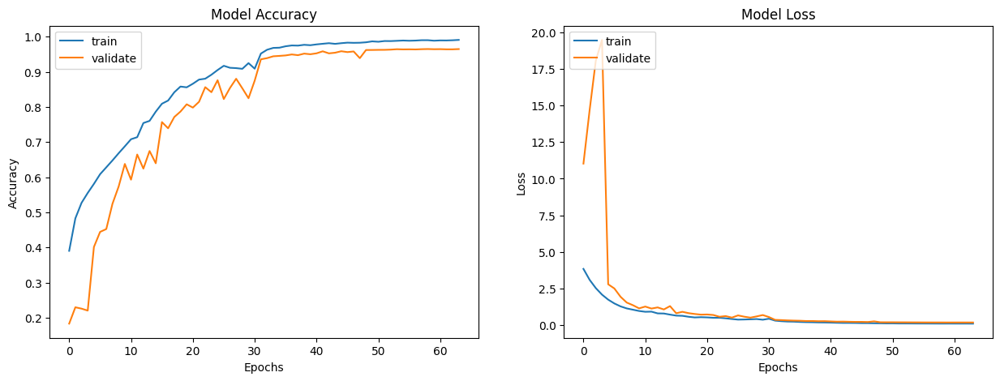

In [33]:
plot_model_history(base_cnn_hist)

In [34]:
evaluate_model(base_cnn)

305/305 [==============================] - 15s 51ms/step - loss: 0.1863 - accuracy: 0.9651
final train accuracy = 99.99 , validation accuracy = 96.51


305/305 [==============================] - 14s 45ms/step


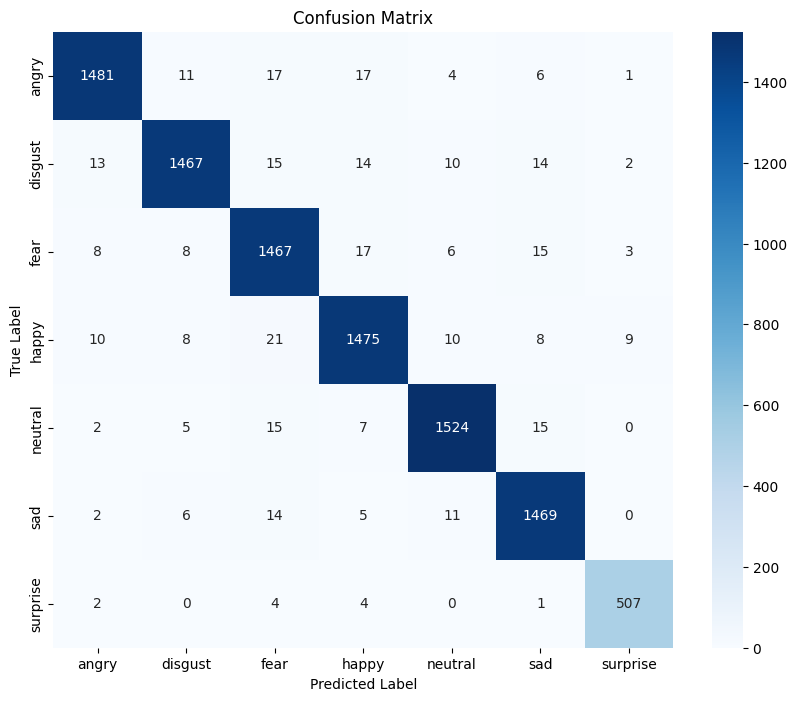

In [35]:
plot_confusion_matrix(base_cnn, X_test_cnn)

In [36]:
print_classification_report(base_cnn, X_test_cnn)

305/305 [==============================] - 10s 34ms/step
Classification Report:
               precision    recall  f1-score   support

       angry       0.98      0.96      0.97      1537
     disgust       0.97      0.96      0.97      1535
        fear       0.94      0.96      0.95      1524
       happy       0.96      0.96      0.96      1541
     neutral       0.97      0.97      0.97      1568
         sad       0.96      0.97      0.97      1507
    surprise       0.97      0.98      0.97       518

    accuracy                           0.97      9730
   macro avg       0.97      0.97      0.97      9730
weighted avg       0.97      0.97      0.97      9730



In [38]:
# Define Model Path
model_name = "CNN"
model_path = os.path.join("models", model_name)
saved_model = os.path.join(model_path, "saved_models")

# Save Model
base_cnn.save(os.path.join(saved_model, "Base_CNN.h5"))
print("Base CNN Model Saved")

Base CNN Model Saved


### 10.1.2 Bi-LSTM

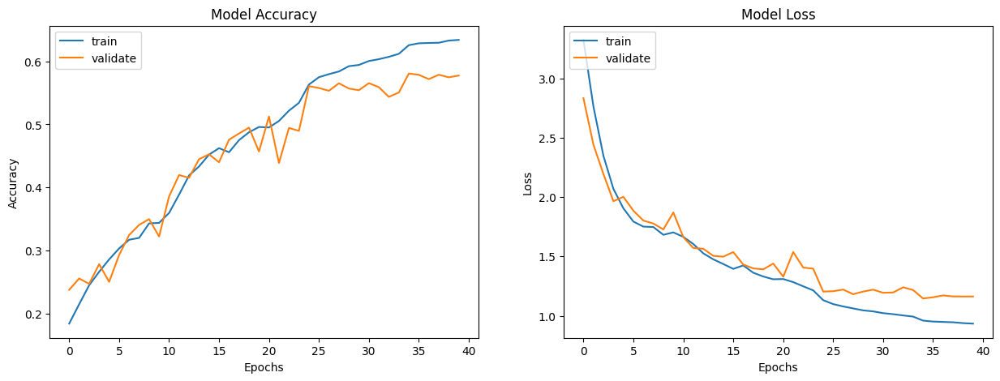

In [31]:
plot_model_history(base_bi_lstm_hist)

In [34]:
evaluate_model_2(base_bi_lstm)

305/305 [==============================] - 194s 637ms/step - loss: 1.1456 - accuracy: 0.5807
final train accuracy = 61.63 , validation accuracy = 58.07


305/305 [==============================] - 193s 624ms/step


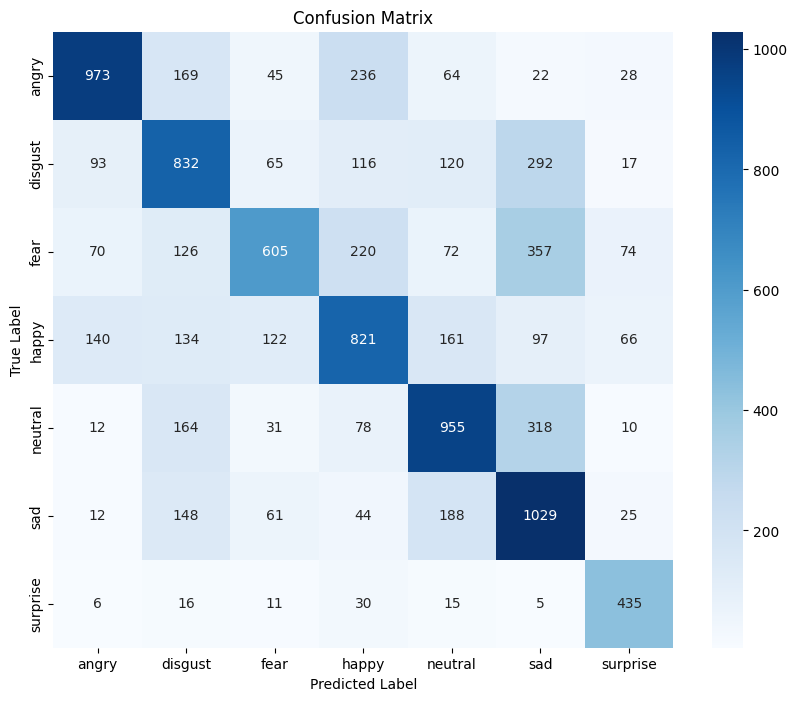

In [36]:
plot_confusion_matrix(base_bi_lstm, X_test)

In [37]:
print_classification_report(base_bi_lstm, X_test)

305/305 [==============================] - 191s 627ms/step
Classification Report:
               precision    recall  f1-score   support

       angry       0.75      0.63      0.68      1537
     disgust       0.52      0.54      0.53      1535
        fear       0.64      0.40      0.49      1524
       happy       0.53      0.53      0.53      1541
     neutral       0.61      0.61      0.61      1568
         sad       0.49      0.68      0.57      1507
    surprise       0.66      0.84      0.74       518

    accuracy                           0.58      9730
   macro avg       0.60      0.61      0.59      9730
weighted avg       0.59      0.58      0.58      9730



In [39]:
# Define Model Path
model_name = "Bi-LSTM"
model_path = os.path.join("models", model_name)
saved_model = os.path.join(model_path, "saved_models")

# Save Model
base_bi_lstm.save(os.path.join(saved_model, "Base_Bi-LSTM.h5"))
print("Base Bi-LSTM Model Saved")

Base Bi-LSTM Model Saved


### 10.1.3 Bi_GRU

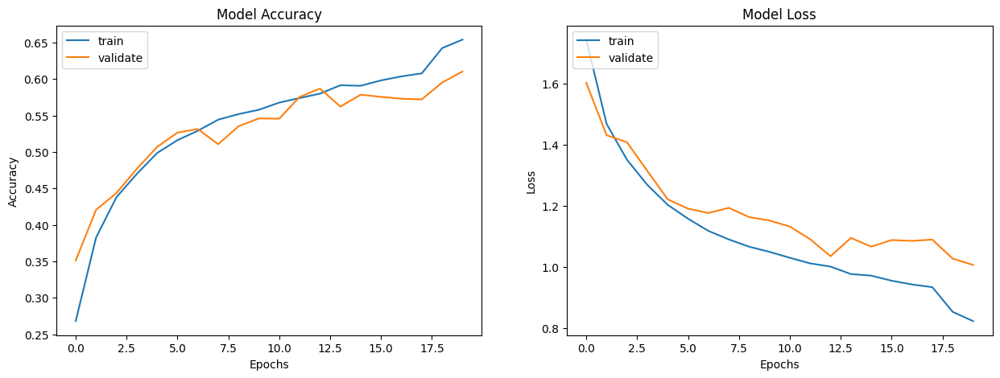

In [34]:
plot_model_history(base_bi_gru_hist)

In [35]:
evaluate_model_2(base_bi_gru, batch_size = 8)

1217/1217 [==============================] - 548s 451ms/step - loss: 1.0068 - accuracy: 0.6103
final train accuracy = 65.51 , validation accuracy = 61.03


1217/1217 [==============================] - 555s 454ms/step


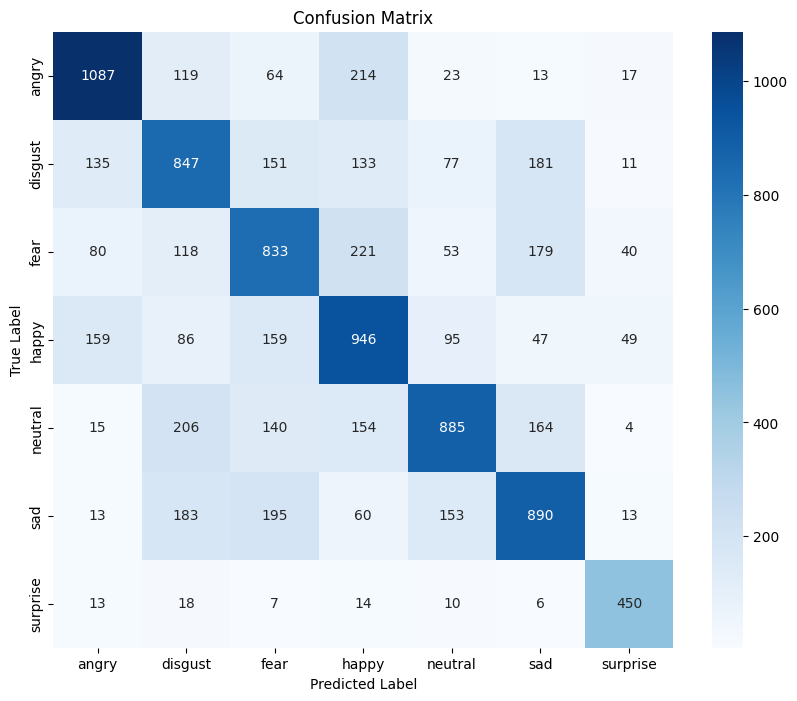

In [36]:
plot_confusion_matrix(base_bi_gru, X_test, batch_size = 8)

In [37]:
print_classification_report(base_bi_gru, X_test, batch_size = 8)

1217/1217 [==============================] - 551s 452ms/step
Classification Report:
               precision    recall  f1-score   support

       angry       0.72      0.71      0.72      1537
     disgust       0.54      0.55      0.54      1535
        fear       0.54      0.55      0.54      1524
       happy       0.54      0.61      0.58      1541
     neutral       0.68      0.56      0.62      1568
         sad       0.60      0.59      0.60      1507
    surprise       0.77      0.87      0.82       518

    accuracy                           0.61      9730
   macro avg       0.63      0.63      0.63      9730
weighted avg       0.61      0.61      0.61      9730



In [38]:
# Define Model Path
model_name = "Bi-GRU"
model_path = os.path.join("models", model_name)
saved_model = os.path.join(model_path, "saved_models")

# Save Model
base_bi_gru.save(os.path.join(saved_model, "Base_Transformer.h5"))
print("Base Bi-GRU Model Saved")

Base Bi-GRU Model Saved


### 10.1.4 CNN-Bi-LSTM

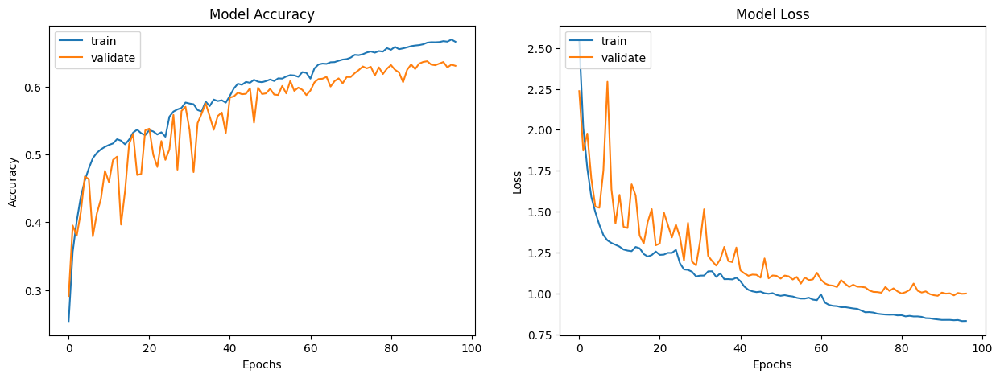

In [38]:
plot_model_history(base_cnn_bi_lstm_hist)

In [40]:
evaluate_model_2(base_cnn_bi_lstm, batch_size = 64)

153/153 [==============================] - 11s 74ms/step - loss: 0.9849 - accuracy: 0.6377
final train accuracy = 68.49 , validation accuracy = 63.77


153/153 [==============================] - 14s 70ms/step


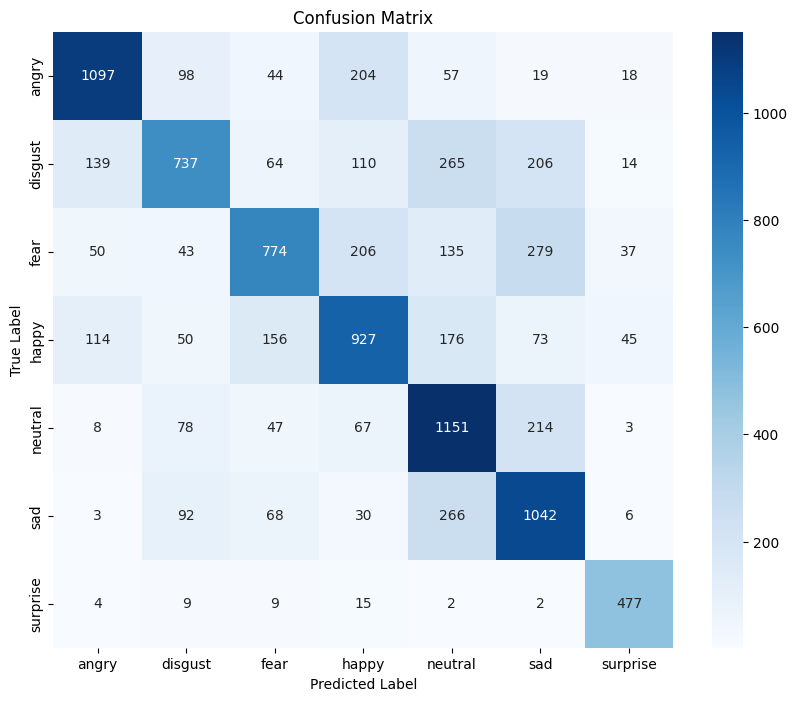

In [41]:
plot_confusion_matrix(base_cnn_bi_lstm, X_test, batch_size = 64)

In [42]:
print_classification_report(base_cnn_bi_lstm, X_test, batch_size = 64)

153/153 [==============================] - 11s 71ms/step
Classification Report:
               precision    recall  f1-score   support

       angry       0.78      0.71      0.74      1537
     disgust       0.67      0.48      0.56      1535
        fear       0.67      0.51      0.58      1524
       happy       0.59      0.60      0.60      1541
     neutral       0.56      0.73      0.64      1568
         sad       0.57      0.69      0.62      1507
    surprise       0.80      0.92      0.85       518

    accuracy                           0.64      9730
   macro avg       0.66      0.66      0.66      9730
weighted avg       0.65      0.64      0.63      9730



In [44]:
# Define Model Path
model_name = "CNN-Bi-LSTM"
model_path = os.path.join("models", model_name)
saved_model = os.path.join(model_path, "saved_models")

# Save Model
base_cnn_bi_lstm.save(os.path.join(saved_model, "Base_Transformer.h5"))
print("Base Transformer Model Saved")

Base Transformer Model Saved


### 10.1.4 Transformer Model

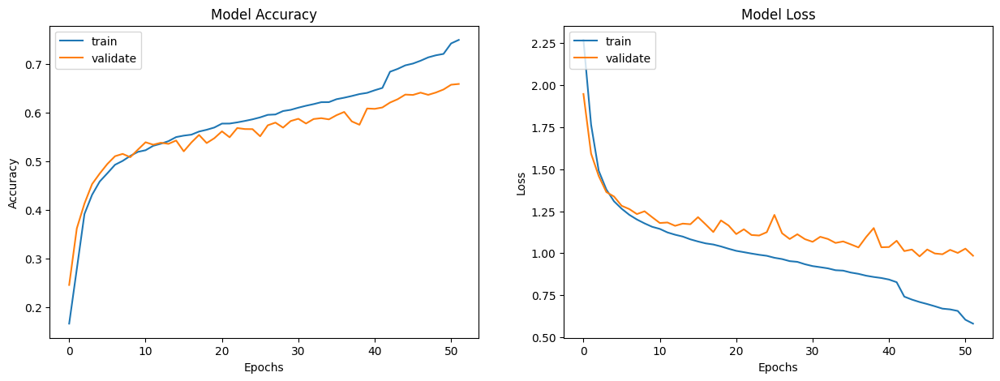

In [63]:
plot_model_history(base_transformer_hist)

In [72]:
evaluate_model_2(base_trans, batch_size = 6)

1622/1622 [==============================] - 131s 81ms/step - loss: 0.9813 - accuracy: 0.6376
final train accuracy = 74.49 , validation accuracy = 63.76


1622/1622 [==============================] - 129s 80ms/step


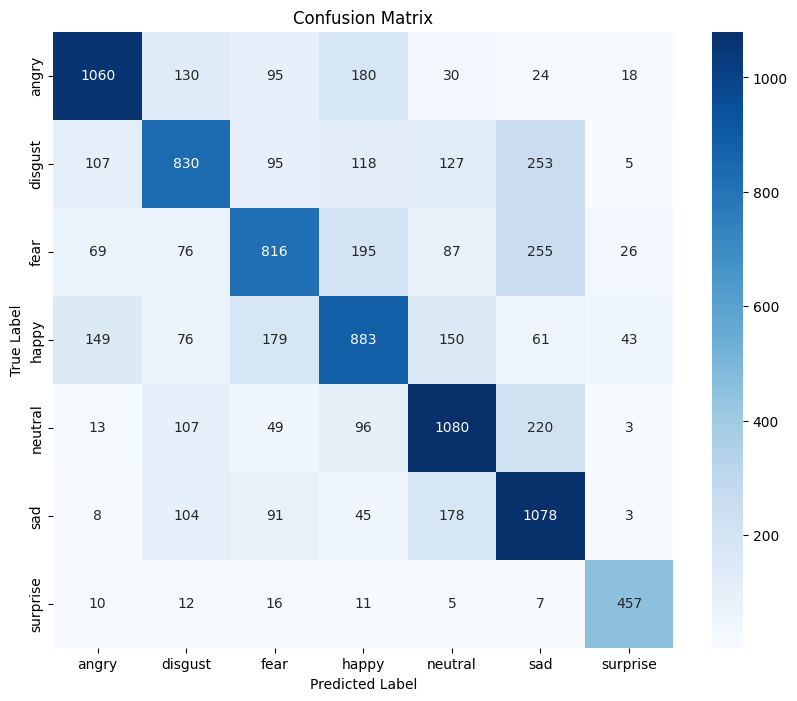

In [73]:
plot_confusion_matrix(base_trans, X_test, batch_size = 6)

In [75]:
print_classification_report(base_trans, X_test, batch_size = 6)

1622/1622 [==============================] - 130s 80ms/step
Classification Report:
               precision    recall  f1-score   support

       angry       0.75      0.69      0.72      1537
     disgust       0.62      0.54      0.58      1535
        fear       0.61      0.54      0.57      1524
       happy       0.58      0.57      0.58      1541
     neutral       0.65      0.69      0.67      1568
         sad       0.57      0.72      0.63      1507
    surprise       0.82      0.88      0.85       518

    accuracy                           0.64      9730
   macro avg       0.66      0.66      0.66      9730
weighted avg       0.64      0.64      0.64      9730



In [77]:
# Define Model Path
model_name = "Transformer"
model_path = os.path.join("models", model_name)
saved_model = os.path.join(model_path, "saved_models")

# Save Model
base_trans.save(os.path.join(saved_model, "Base_Transformer.h5"))
print("Base Transformer Model Saved")

Base Transformer Model Saved


## 10.2 Tuned Models

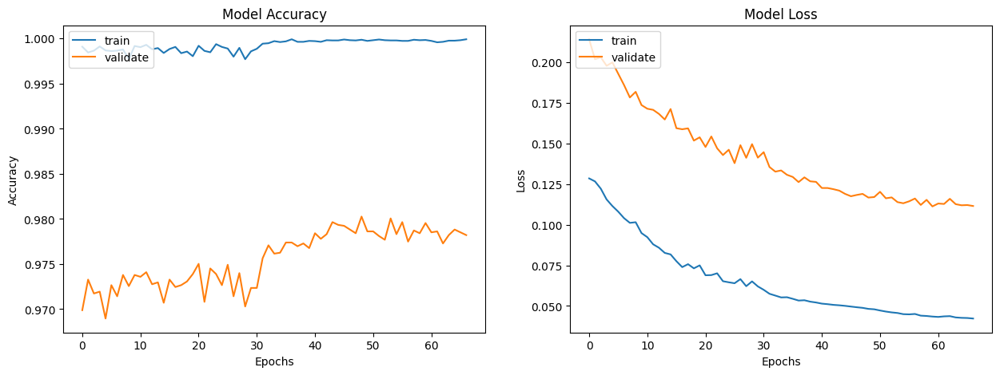

In [56]:
plot_model_history(best_cnn_hist)

In [57]:
evaluate_model(best_cnn_model)

305/305 [==============================] - 10s 33ms/step - loss: 0.1112 - accuracy: 0.9794
final train accuracy = 100.00 , validation accuracy = 97.94


305/305 [==============================] - 9s 30ms/step


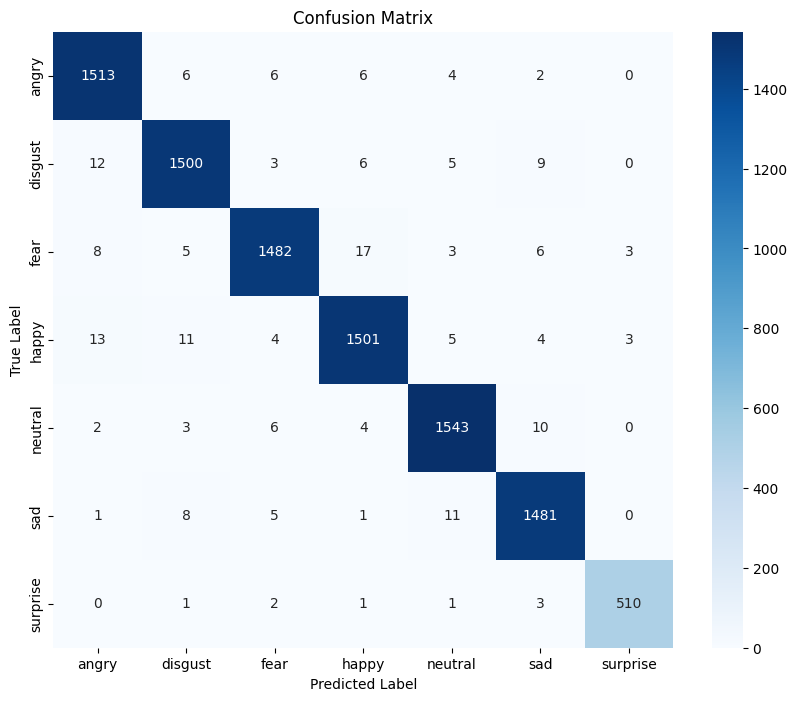

In [58]:
plot_confusion_matrix(best_cnn_model, X_test_cnn)

In [59]:
print_classification_report(best_cnn_model, X_test_cnn)

305/305 [==============================] - 9s 30ms/step
Classification Report:
               precision    recall  f1-score   support

       angry       0.98      0.98      0.98      1537
     disgust       0.98      0.98      0.98      1535
        fear       0.98      0.97      0.98      1524
       happy       0.98      0.97      0.98      1541
     neutral       0.98      0.98      0.98      1568
         sad       0.98      0.98      0.98      1507
    surprise       0.99      0.98      0.99       518

    accuracy                           0.98      9730
   macro avg       0.98      0.98      0.98      9730
weighted avg       0.98      0.98      0.98      9730



In [60]:
# Define Model Path
model_name = "CNN"
model_path = os.path.join("models", model_name)
saved_model = os.path.join(model_path, "saved_models")

# Save Model
best_cnn_model.save(os.path.join(saved_model, "Best_CNN.h5"))
print("Best CNN Model Saved")

Best CNN Model Saved


# 11.0 Result

## 11.1 Setup

In [4]:
# Define Paths
SPEECH_MODEL = "models/CNN/saved_models/Best_CNN.h5"
SCALER_PATH = "ser_scaler.pkl"
LABEL_PATH = "ser_encoder.pkl"

In [5]:
# Load Model
if os.path.exists(SPEECH_MODEL):
    ser_model = load_model(SPEECH_MODEL)
else:
    print("[ERROR] Saved scaler not found!")
    sys.exit(1)


# Load Scaler
if os.path.exists(SCALER_PATH):
    scaler = joblib.load(SCALER_PATH)
else:
    print("[ERROR] Saved scaler not found!")
    sys.exit(1)

# Load Label
if os.path.exists(LABEL_PATH):
    encoder = joblib.load(LABEL_PATH)
else:
    print("[ERROR] Saved scaler not found!")
    sys.exit(1)

In [12]:
# https://stackoverflow.com/questions/75799092/librosa-error-attributeerror-module-librosa-display-has-no-attribute-wave
# Waveplot
def create_waveplot(data, sr, e):
    plt.figure(figsize = (10, 3))
    plt.title('Waveplot for audio with {} emotion'.format(e), size = 15)
    librosa.display.waveshow(data, sr = sr)
    plt.show()

# Spectogram
def create_spectrogram(data, sr, e):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize = (12, 3))
    plt.title('Spectrogram for audio with {} emotion'.format(e), size = 15)
    librosa.display.specshow(Xdb, sr = sr, x_axis = 'time', y_axis = 'hz')   
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()

## 11.2 Data Preprocessing

In [6]:
# Resampling
def resample_audio(file_path, target_sr = 16000):
    
    data, sr = librosa.load(file_path, sr = None)
    
    if sr != target_sr:
        data = librosa.resample(data, orig_sr = sr, target_sr = target_sr)
        
    return data, target_sr

# Trimming
def trim_audio(data, top_db = 20):
    
    trimmed_data, _ = librosa.effects.trim(data, top_db = top_db)
    
    return trimmed_data

# Normalisation
def normalize_audio(data):
    
    max_amplitude = np.max(np.abs(data))
    
    if max_amplitude > 0:
        data = data / max_amplitude
        
    return data

# Fix audio length
def fix_audio_length(data, target_length, sr):
    
    target_samples = int(target_length * sr)
    
    if len(data) > target_samples:  # Truncate
        data = data[:target_samples]
        
    elif len(data) < target_samples:  # Pad
        
        pad_length = target_samples - len(data)
        data = np.pad(data, (0, pad_length), mode = 'constant')
        
    return data

In [7]:
# Function to process the audio: resample and normalize
def process_audio(file_path, target_sr = 16000, duration = 2.5):
    
    # Load and resample audio
    data, sr = librosa.load(file_path, sr = target_sr)

    # Trim leading/trailing silence
    data = trim_audio(data)

    # Normalize amplitude
    data = normalize_audio(data)

    # Fix the audio length to ensure consistent feature dimensions
    data = fix_audio_length(data, target_length=duration, sr=sr)

    return data, sr

## 11.3 Feature Extraction

In [8]:
# Zero Crossing Rate
def zcr(data, frame_length, hop_length):
    # Perform ZCR
    zcr = librosa.feature.zero_crossing_rate(
        data,frame_length = frame_length,
        hop_length = hop_length
    )
    
    return np.squeeze(zcr)

# STFT Function
def stft(data, sr, frame_length = 2048, hop_length = 512):
    # Perform Short-Time Fourier Transform (STFT)
    stft_result = librosa.stft(
        y = data, 
        n_fft = frame_length, 
        hop_length = hop_length
    )
    
    # Convert the amplitude to decibels
    stft_db = librosa.amplitude_to_db(np.abs(stft_result), ref = np.max)
    
    return stft_db

# RMSE
def rmse(data,frame_length = 2048, hop_length = 512):
    # Perform RMSE
    rmse = librosa.feature.rms(
        y = data, 
        frame_length = frame_length, 
        hop_length = hop_length
    )
    
    return np.squeeze(rmse)

# MFCC
def mfcc(data, sr, frame_length = 2048, hop_length = 512, flatten:bool = True):
    # Perform MFCC
    mfcc = librosa.feature.mfcc(
        y = data,
        sr = sr
    )
    
    return np.squeeze(mfcc.T)if not flatten else np.ravel(mfcc.T)

# MEL
def mel_spectrogram(data, sr, n_mels = 128, frame_length = 2048, hop_length = 512):
    # Perform MEL
    mel_spect = librosa.feature.melspectrogram(
        y = data, 
        sr = sr, 
        n_mels = n_mels, 
        hop_length = hop_length, 
        n_fft = frame_length
    )
    
    return np.squeeze(mel_spect)

In [9]:
def extract_features(data, sr=22050, frame_length=2048, hop_length=512, expected_size=2376):

    result = np.array([])

    # Extract features
    zcr_feat = zcr(data, frame_length, hop_length)
    rmse_feat = rmse(data, frame_length, hop_length)
    mfcc_feat = mfcc(data, sr, frame_length, hop_length)

    # Concatenate extracted features into a 1D array
    result = np.hstack((result, zcr_feat, rmse_feat, mfcc_feat))

    # Debugging feature size before fixing
    print(f"Original extracted feature size: {len(result)}")

    # **Fix feature size to 2376**
    if len(result) < expected_size:
        # **Padding if too short**
        result = np.pad(result, (0, expected_size - len(result)), mode='constant')
    elif len(result) > expected_size:
        # **Truncate if too long**
        result = result[:expected_size]

    # Debugging feature size after fixing
    print(f"Final feature size after fixing: {len(result)}")

    return result


## 11.4 Evaluation

In [10]:
def get_predict_feat(path, duration = 2.5,  target_sr = 16000,):
    
    d, s_rate = librosa.load(path, duration = 2.5, offset = 0.6)
    res = extract_features(d)
    result = np.array(res)
    result = np.reshape(result,newshape = (1,2376))
    i_result = scaler.transform(result)
    final_result = np.expand_dims(i_result, axis = 2)
    
    return final_result

In [11]:
def prediction(path1):
    
    res = get_predict_feat(path1)
    predictions = ser_model.predict(res)
    y_pred = encoder.inverse_transform(predictions)
    print(y_pred[0][0])    

### 11.4.1 Test Case 1

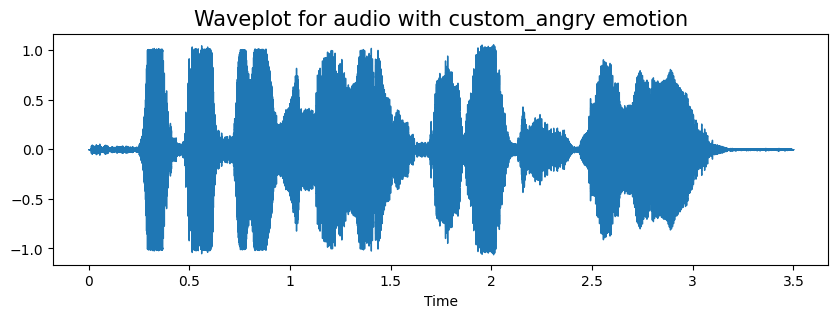

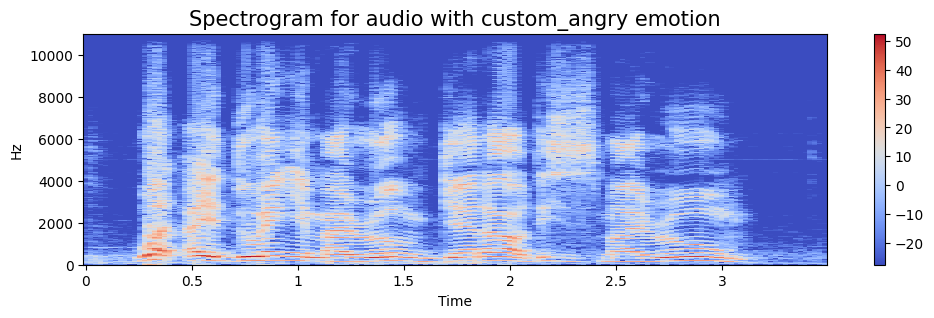

In [21]:
# Emotion
emotion = 'custom_angry'

# Waveplot
path = "../dataset/Speech/Custom/Angry_Test.m4a"
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

In [22]:
prediction("../dataset/Speech/Custom/Angry_Test.m4a")

Original extracted feature size: 2376
Final feature size after fixing: 2376
1/1 [==============================] - 0s 26ms/step
angry


### 11.4.2 Test Case 2

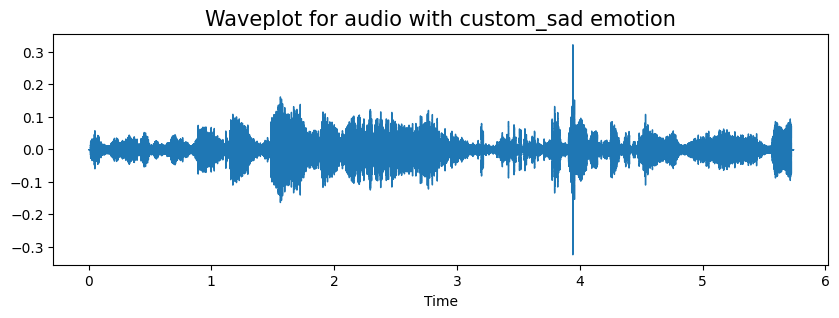

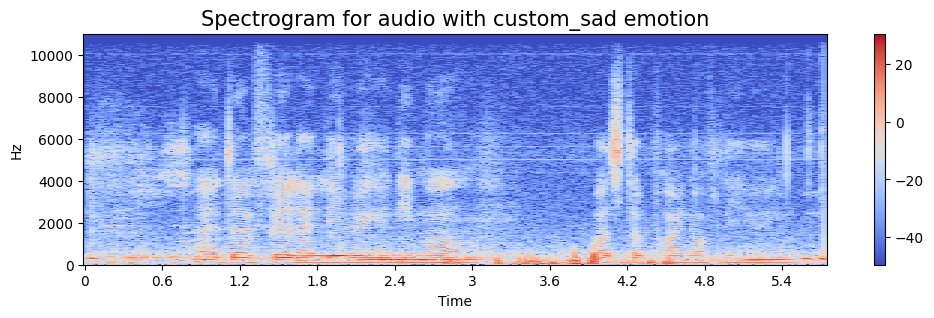

In [23]:
# Emotion
emotion = 'custom_sad'

# Waveplot
path = "../dataset/Speech/Custom/Sadness_Test.m4a"
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

In [24]:
prediction("../dataset/Speech/Custom/Sadness_Test.m4a")

Original extracted feature size: 2376
Final feature size after fixing: 2376
1/1 [==============================] - 0s 24ms/step
sad


### 11.4.3 Test Case 3

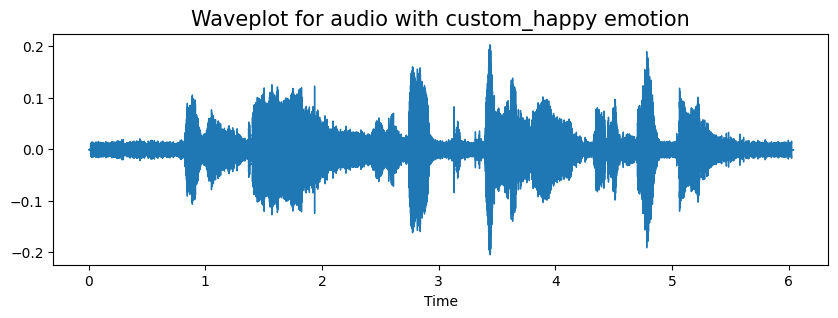

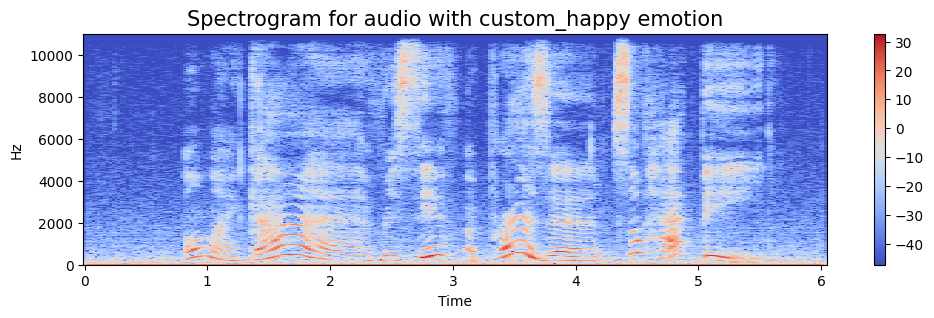

In [27]:
# Emotion
emotion = 'custom_happy'

# Waveplot
path = "../dataset/Speech/Custom/happy-present.m4a"
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

In [30]:
prediction("../dataset/Speech/Custom/happy-present.m4a")

Original extracted feature size: 2376
Final feature size after fixing: 2376
1/1 [==============================] - 0s 24ms/step
disgust


### 11.4.4

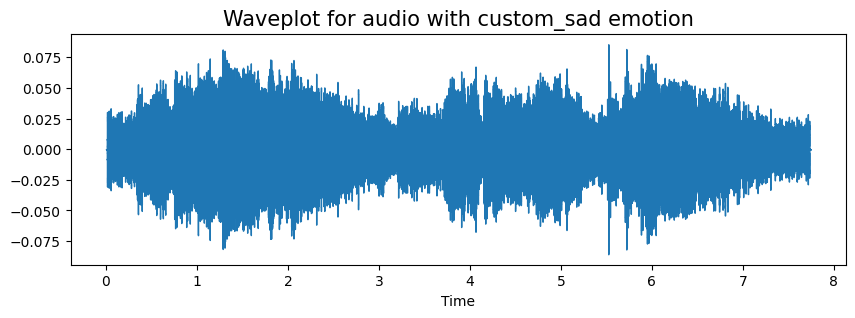

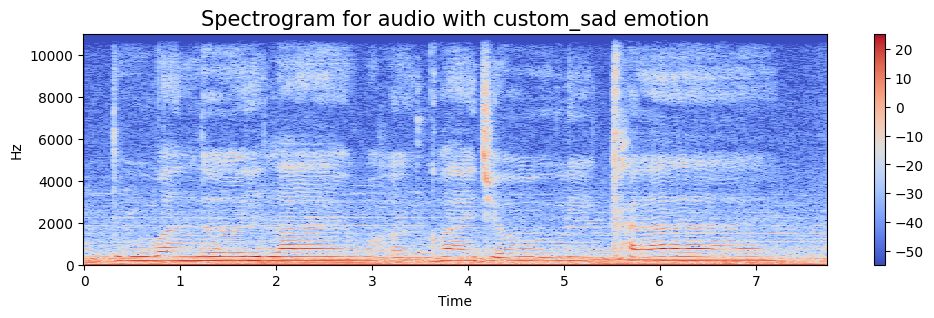

In [29]:
# Emotion
emotion = 'custom_sad'

# Waveplot
path = "../dataset/Speech/Custom/sad-leaving.m4a"
data, sampling_rate = librosa.load(path)

# Spectogram
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

In [31]:
prediction("../dataset/Speech/Custom/sad-leaving.m4a")

Original extracted feature size: 2376
Final feature size after fixing: 2376
1/1 [==============================] - 0s 21ms/step
disgust
